In [493]:
import os, glob

import pickle
import numpy as np
import pandas as pd
import lightkurve as lk
import matplotlib.pyplot as plt
from matplotlib import colors
from matplotlib import patches
from tqdm.auto import tqdm

from astropy.io import fits
from astropy.table import Table

path = os.path.dirname(os.getcwd())
sys.path.append(path)
from kepler_apertures import EXBAMachine

from astropy.timeseries import LombScargle

from astroquery.simbad import Simbad

%matplotlib inline

In [392]:
Q = 5
quarters = np.arange(5, 18)
channels = np.arange(1, 85)
channels = np.delete(channels, [4,5,6,7])
quarters, channels

(array([ 5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17]),
 array([ 1,  2,  3,  4,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21,
        22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38,
        39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55,
        56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72,
        73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84]))

In [393]:
# Load EXBA stamp, catalo, and metadata
catalogs_dict = {}
stamps = {}
for ch in channels:
    hdu = fits.open("../data/export/%i/%02i/image_q%i_ch%02i_gaiadr3.fits.gz" % (Q, ch, Q, ch))
    hdr = hdu[0].header
    img = hdu[1].data
    cat = Table(hdu[2].data).to_pandas()
    cat["channel"] = ch
    catalogs_dict[ch] = cat
    stamps[ch] = img

In [394]:
catalogs = pd.concat(list(catalogs_dict.values()), axis=0)

In [395]:
catalogs

,designation,ra,ra_error,dec,dec_error,pmra,pmdec,parallax,parallax_error,phot_g_n_obs,...,phot_bp_mean_flux_error,phot_bp_mean_mag,phot_rp_n_obs,phot_rp_mean_flux,phot_rp_mean_flux_error,phot_rp_mean_mag,col,row,clean_flag,channel
0,Gaia EDR3 2105384211065299328,282.026014,0.190857,44.253779,0.223919,-19.973063,-18.944105,0.589230,0.221065,381,...,6.232264,20.573519,38,333.183741,8.763941,18.441187,589.627063,564.800390,0,1
1,Gaia EDR3 2105384241127278208,282.006752,0.132529,44.253545,0.153231,-1.771941,-2.529980,0.150096,0.155027,400,...,8.967708,19.520166,42,319.307750,8.512412,18.487371,581.934457,574.643130,0,1
2,Gaia EDR3 2105384245425035392,282.014153,0.058103,44.253572,0.065566,-1.188432,-1.331190,0.649663,0.066387,406,...,9.663919,18.431139,46,1368.992379,8.267079,16.906893,584.934878,570.897833,0,1
3,Gaia EDR3 2105384245425036032,282.011585,0.046780,44.256934,0.052581,-0.148561,2.350119,0.418869,0.052441,401,...,11.900966,17.762989,47,1652.775606,9.110782,16.702360,581.521272,570.276916,0,1
4,Gaia EDR3 2105384275487021696,282.017593,0.112678,44.257041,0.131294,-3.580035,-7.079613,0.074377,0.129395,399,...,9.323002,19.093567,44,396.873204,7.354785,18.251266,583.897305,567.187724,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
139,Gaia EDR3 2082093084451836672,300.653004,0.061514,44.588119,0.065605,-0.235085,-3.564849,0.907278,0.070094,402,...,117.696410,13.698483,18,52877.803214,81.498380,12.939712,590.757939,612.826045,0,84
140,Gaia EDR3 2082093084461923328,300.653054,0.009019,44.588811,0.009152,-0.248913,-3.515599,0.483296,0.010030,386,...,89.806490,13.452034,42,75874.294503,373.045000,12.547659,591.307008,612.523093,0,84
141,Gaia EDR3 2082093114517217792,300.671656,0.054884,44.592181,0.059461,-2.996679,-4.151838,0.013717,0.064693,344,...,5.368159,18.181053,39,2143.606853,7.028993,16.420033,588.803715,600.413672,0,84
142,Gaia EDR3 2082093118821672064,300.669917,0.039097,44.592086,0.042450,-6.740028,-9.498733,0.485806,0.044821,357,...,7.915853,17.330301,40,3231.674951,8.648198,15.974326,589.217069,601.458490,0,84


In [53]:
# Load EXBA stamp, catalo, and metadata
power, frequency = [], []
bls_results = {}
clcs = {}
for ch in tqdm(channels):
    aux = pickle.load(open("../data/export/%i/%02i/bls_results_q%i_ch%02i.pkl" % (Q, ch, Q, ch), "rb"))
    power.append(aux["power"])
    frequency.append(aux["frequency"])
    clcs[ch] = aux["lc_corrected"]
    df_ = aux["table"]
    df_["channel"] = ch
    bls_results[ch] = df_
    
df = pd.concat(list(bls_results.values()), axis=0)

  0%|          | 0/80 [00:00<?, ?it/s]

In [54]:
def plot_stamp(flux, catalog, idx, aperture=None, ax=None, row0=0, col0=0):

    if ax is None:
        fig, ax = plt.subplots(1)
    pc = ax.pcolor(
        flux,
        shading="auto",
        norm=colors.SymLogNorm(linthresh=50, vmin=3, vmax=5000, base=10),
    )
    ax.scatter(
        catalog.col - col0 + 0.5,
        catalog.row - row0 + 0.5,
        s=20,
        facecolors="y",
        marker="o",
        edgecolors="k",
    )
    ax.scatter(
        catalog.col.iloc[idx] - col0 + 0.5,
        catalog.row.iloc[idx] - row0 + 0.5,
        s=25,
        facecolors="r",
        marker="o",
        edgecolors="r",
    )
    ax.set_xlabel("Pixels")
    ax.set_ylabel("Pixels")
    plt.colorbar(pc, label=r"Flux ($e^{-}s^{-1}$)", ax=ax)
    ax.set_aspect("equal", adjustable="box")

    if not aperture is None:
        for i in range(flux.shape[0]):
            for j in range(flux.shape[1]):
                if aperture[i, j]:
                    rect = patches.Rectangle(
                        xy=(j, i),
                        width=1,
                        height=1,
                        color="red",
                        fill=False,
                        hatch="",
                        lw=1.5,
                    )
                    ax.add_patch(rect)
        zoom = np.argwhere(aperture == True)
        ax.set_ylim(
            np.maximum(0, zoom[0, 0] - 5),
            np.minimum(zoom[-1, 0] + 5, flux.shape[0]),
        )
        ax.set_xlim(
            np.maximum(0, zoom[0, -1] - 5),
            np.minimum(zoom[-1, -1] + 5, flux.shape[1]),
        )

    return ax

# EBs candidates

In [401]:
big_cat_path = "../data/catalogs/EXBA_catalog_all_sources.csv"
full_cat = pd.read_csv(big_cat_path, index_col=0, header=[0, 1])

In [452]:
full_cat

5                                 \
                                       ra  ra_error        dec dec_error   
designation                                                                
Gaia EDR3 2105384211065299328  282.026014  0.190857  44.253779  0.223919   
Gaia EDR3 2105384241127278208  282.006752  0.132529  44.253545  0.153231   
Gaia EDR3 2105384245425035392  282.014153  0.058103  44.253572  0.065566   
Gaia EDR3 2105384245425036032  282.011585  0.046780  44.256934  0.052581   
Gaia EDR3 2105384275487021696  282.017593  0.112678  44.257041  0.131294   
...                                   ...       ...        ...       ...   
Gaia EDR3 2086539951857563136         NaN       NaN        NaN       NaN   
Gaia EDR3 2129526011778662272         NaN       NaN        NaN       NaN   
Gaia EDR3 2143714973114706560         NaN       NaN        NaN       NaN   
Gaia EDR3 2076208704382822912         NaN       NaN        NaN       NaN   
Gaia EDR3 2082091710075415424         NaN       NaN        NaN       NaN   

                                                                              \
                                    pmra      pmdec  parallax parallax_error   
designation                                                                    
Gaia EDR3 2105384211065299328 -19.973063 -18.944105  0.589230       0.221065   
Gaia EDR3 2105384241127278208  -1.771941  -2.529980  0.150096       0.155027   
Gaia EDR3 2105384245425035392  -1.188432  -1.331190  0.649663       0.066387   
Gaia EDR3 2105384245425036032  -0.148561   2.350119  0.418869       0.052441   
Gaia EDR3 2105384275487021696  -3.580035  -7.079613  0.074377       0.129395   
...                                  ...        ...       ...            ...   
Gaia EDR3 2086539951857563136        NaN        NaN       NaN            NaN   
Gaia EDR3 2129526011778662272        NaN        NaN       NaN            NaN   
Gaia EDR3 2143714973114706560        NaN        NaN       NaN            NaN   
Gaia EDR3 2076208704382822912        NaN        NaN       NaN            NaN   
Gaia EDR3 2082091710075415424        NaN        NaN       NaN            NaN   

                                                             ...  \
                              phot_g_n_obs phot_g_mean_flux  ...   
designation                                                  ...   
Gaia EDR3 2105384211065299328        381.0       299.725303  ...   
Gaia EDR3 2105384241127278208        400.0       445.305440  ...   
Gaia EDR3 2105384245425035392        406.0      1588.221303  ...   
Gaia EDR3 2105384245425036032        401.0      2265.134400  ...   
Gaia EDR3 2105384275487021696        399.0       582.028616  ...   
...                                    ...              ...  ...   
Gaia EDR3 2086539951857563136          NaN              NaN  ...   
Gaia EDR3 2129526011778662272          NaN              NaN  ...   
Gaia EDR3 2143714973114706560          NaN              NaN  ...   
Gaia EDR3 2076208704382822912          NaN              NaN  ...   
Gaia EDR3 2082091710075415424          NaN              NaN  ...   

                                         17                    \
                              phot_rp_n_obs phot_rp_mean_flux   
designation                                                     
Gaia EDR3 2105384211065299328          38.0        333.183741   
Gaia EDR3 2105384241127278208          42.0        319.307750   
Gaia EDR3 2105384245425035392          46.0       1368.992379   
Gaia EDR3 2105384245425036032          47.0       1652.775606   
Gaia EDR3 2105384275487021696          44.0        396.873204   
...                                     ...               ...   
Gaia EDR3 2086539951857563136           NaN               NaN   
Gaia EDR3 2129526011778662272           NaN               NaN   
Gaia EDR3 2143714973114706560          36.0       8757.888921   
Gaia EDR3 2076208704382822912          40.0        673.075036   
Gaia EDR3 2082091710075415424          14.0        970.4

In [454]:
ebs_cand = pd.read_csv('eb_candidates.csv').drop(["index", "Unnamed: 0", "batch"], axis=1)
ebs_cand = ebs_cand.set_index("designation")

In [457]:
ebs_cand["channel"] = 0
ebs_cand["quarter"] = 0
for gid in ebs_cand.index:
    havedata = np.where(np.isfinite(full_cat.loc[gid, ([str(q) for q in quarters], "channel")]))[0]
    
    ebs_cand.loc[gid, "quarter"] = int(quarters[havedata][0])
    ebs_cand.loc[gid, "channel"] = int(full_cat.loc[gid, (str(quarters[havedata][0]), "channel")])
    ebs_cand.loc[gid, "ra"] = full_cat.loc[gid, (str(quarters[havedata][0]), "ra")]
    ebs_cand.loc[gid, "dec"] = full_cat.loc[gid, (str(quarters[havedata][0]), "dec")]

In [491]:
ebs_cand.to_csv('eb_candidates.csv')

In [492]:
ebs_cand

,BLS_period,BLS_period_SNR,BLS_duration,BLS_depth,BLS_transit_time,channel,quarter,ra,dec
designation,,,,,,,,,
Gaia EDR3 2104814389164263168,0.595171,1497.167118,0.051,0.043160,2.455277e+06,3,5,281.863289,42.639542
Gaia EDR3 2104814453586115328,0.595171,429.935983,0.051,0.003186,2.455277e+06,3,5,281.858955,42.638243
Gaia EDR3 2100490555389337984,0.580361,1095.924153,0.051,0.111263,2.455277e+06,9,5,286.659364,39.717271
Gaia EDR3 2100240347774313728,1.672736,335.224454,0.099,0.109797,2.455277e+06,12,5,285.514700,39.099597
Gaia EDR3 2107265956496766208,0.604584,15434.251611,0.450,0.050878,2.455277e+06,17,5,285.191785,46.000274
...,...,...,...,...,...,...,...,...,...
Gaia EDR3 2079588461390777216,0.869922,58.079964,0.099,0.009415,2.455464e+06,19,7,296.394426,44.295391
Gaia EDR3 2052499488484828928,0.523529,499.907249,0.450,0.005711,2.455463e+06,33,7,293.701484,39.768009
Gaia EDR3 2052499488484831616,0.523529,1513.347484,0.450,0.065289,2.455463e+06,33,7,293.704414,39.768631


In [570]:
ebs_cand = pd.read_csv('eb_candidates.csv').set_index("designation")
ebs_cand

,BLS_period,BLS_period_SNR,BLS_duration,BLS_depth,BLS_transit_time,channel,quarter,ra,dec
designation,,,,,,,,,
Gaia EDR3 2104814389164263168,0.595171,1497.167118,0.051,0.043160,2.455277e+06,3,5,281.863289,42.639542
Gaia EDR3 2100490555389337984,0.580361,1095.924153,0.051,0.111263,2.455277e+06,9,5,286.659364,39.717271
Gaia EDR3 2100240347774313728,1.672736,335.224454,0.099,0.109797,2.455277e+06,12,5,285.514700,39.099597
Gaia EDR3 2107265956496766208,0.604584,15434.251611,0.450,0.050878,2.455277e+06,17,5,285.191785,46.000274
Gaia EDR3 2107266536313762816,1.640355,2427.490416,0.099,0.126843,2.455277e+06,17,5,285.176035,46.016328
...,...,...,...,...,...,...,...,...,...
Gaia EDR3 2127956149696086272,0.601936,193.257546,0.399,0.019349,2.455373e+06,45,6,293.828766,45.208002
Gaia EDR3 2073682640842559360,0.707867,1098.842939,0.126,0.059683,2.455464e+06,16,7,297.643417,40.232566
Gaia EDR3 2077245814431169792,0.637804,1289.253464,0.051,0.321825,2.455464e+06,17,7,295.916197,42.741738


### check simbad

### remove contaminated:

In [460]:
from astropy.coordinates import SkyCoord, match_coordinates_3d

In [461]:
s_coords = SkyCoord(ebs_cand.ra, ebs_cand.dec, unit=("deg"))
midx, mdist = match_coordinates_3d(s_coords, s_coords, nthneighbor=2)[:2]
# remove sources closer than 4" = 1 pix
closest = mdist.arcsec < 8.0

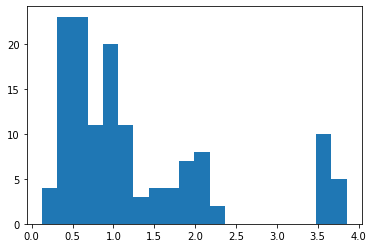

In [465]:
plt.hist(np.log10(mdist.arcsec), bins=20);

## Helping functions

In [470]:
def correct_lc(lc, plot=False):
    # creating Design matrix
    times = lc.time.jd
    breaks = list(np.where(np.diff(times) > 0.3)[0] + 1)
    # spline DM
    n_knots = int((lc.time[-1] - lc.time[0]).value / 0.8)
    spline_dm = lk.designmatrix.create_spline_matrix(
        times,
        n_knots=n_knots,
        include_intercept=True,
        name="spline_dm",
    )#.split(breaks)
    spline_dm = lk.DesignMatrix(
        spline_dm.X[:, spline_dm.X.sum(axis=0) != 0], name="spline_dm"
    )
    # offset matrix
    offset_dm = lk.DesignMatrix(np.ones_like(times), name="offset")#.split(breaks)
    offset_dm.prior_mu = np.ones(1)
    offset_dm.prior_sigma = np.ones(1) * 0.000001

    # DM with CBVs, first 4 only
    cbvs = lk.correctors.download_kepler_cbvs(
        mission="Kepler", quarter=lc.meta["QUARTER"], channel=lc.meta["CHANNEL"]
    )
    basis = 4
    cbv_dm = cbvs[
        np.in1d(cbvs.cadenceno.value, lc.cadenceno.value)
    ].to_designmatrix()
    cbv_dm = lk.DesignMatrix(cbv_dm.X[:, :basis], name="cbv").split(breaks)
    cbv_dm.prior_mu = np.ones(basis * (len(breaks)+ 1))
    cbv_dm.prior_sigma = np.ones(basis * (len(breaks)+ 1)) * 10

    # collection of DMs
    dmc = lk.DesignMatrixCollection([offset_dm, cbv_dm, spline_dm])
    
    rc = lk.RegressionCorrector(lc)
    clc = rc.correct(dmc, sigma=3)
    if plot:
        rc.diagnose()
        plt.show()
    return clc


def give_me_lc(table, aperture="7", plot=False):
    quarter = 5
    clcs = {}
    metrics = {}
    for i, row, in table.iterrows():
    
        fname = "../data/export/%i/%02i/lc_q%i_ch%02i_%s.fits.gz" % (row.quarter, row.channel, row.quarter, row.channel, i.replace(" ", "_"))
        try:
            lc = lk.KeplerLightCurve.read(fname)
        except FileNotFoundError:
            print("No file: ", fname)
            continue
            
        flx_complet = lc.meta["FLFRSAP%s" % (str(aperture))]
        flx_crowd = lc.meta["CRWDSAP%s" % (str(aperture))]
        new_lc = lc.copy()
        ext = aperture if aperture != "O" else ""
        new_lc.flux = lc["flux%s" % str(ext)]
        new_lc.flux_err = lc["flux_err%s" % str(ext)]
        for ap in range(1, 8):
            if ap == aperture:
                continue
            new_lc.remove_columns(["flux%s" % str(ap), "flux_err%s" % str(ap)])

        new_lc.flux = (new_lc.flux.value - (1 - flx_crowd) * np.median(new_lc.flux.value)) * lc.flux.unit
            
        clc = correct_lc(new_lc, plot=plot)
        clcs[i] = clc
        metrics[i] = [flx_complet, flx_crowd]
        
    return clcs, metrics

def do_periodogram(clc, pmin=0.26, pmax=20, dur0=None, ffrac=10, method="bls", plot=True, ax=None):
    
    if dur0 is None:
        durations = np.linspace(0.001, 0.2, 21)
    else:
        durations = np.linspace(0.1 * dur0, 0.99 * pmin, 51)
    periods   = 1 / np.linspace(1/pmin, 1/pmax, 10000)

    clc = clc.remove_outliers(sigma_lower=1e10, sigma_upper=3).normalize()
    if method == "bls":
        periodogram = clc.to_periodogram(method="bls", period=periods, frequency_factor=ffrac, duration=durations)
        
        period   = periodogram.period_at_max_power
        t0       = periodogram.transit_time_at_max_power
        duration = periodogram.duration_at_max_power
        depth    = periodogram.depth_at_max_power
    elif method == "ls":
        freq, power = LombScargle(clc.time.mjd, clc.flux.value, clc.flux_err.value).autopower(minimum_frequency=1/(pmax),
                                                                                              maximum_frequency=1/(pmin))
        period = 1 / freq[np.argmax(power)] * units.day
        t0     = dur0
        
    if clc.label in ["Gaia EDR3 2078117181696007296","Gaia EDR3 2127398048763649920", "Gaia EDR3 2052499488484831616"]:
        period *= 0.5
        
    results = {"designation": clc.label,
               "period": period.value,
               "t0": t0.bkjd,
               "duration": duration.value,
               "depth": depth.value,}

    if plot:
        if ax is None:
            fig, ax = plt.subplots(1,1, figsize=(7,3))

        fclc = clc.fold(
            period=period,
            epoch_time=t0,
        )
        info = "%s \nP = %.5f d" % (clc.label, period.value)

        fclc.errorbar(alpha=0.9, c='tab:blue', label=info, ax=ax, rasterized=False)
        # fclc.bin(bins=2000).plot(ax=ax, alpha=0.8, lw=0, c='k', 
        #                          marker=".", ms=1, 
        #                          label=info)
        ax.legend(loc="lower left", fontsize=11)
        
        if clc.label == "Gaia EDR3 2128267968619535872":
            ax.set_ylim(0.98, 1.012)
        return results, ax
    else:
        return results

# Paper plots 

In [559]:
paper_ebs_id = [
          "Gaia EDR3 2077246024892437120", "Gaia EDR3 2100490555389337984",
          "Gaia EDR3 2100240347774313728", "Gaia EDR3 2101753619371695872",
         ]

In [560]:
ebs = ebs_cand[np.in1d(ebs_cand.index, paper_ebs_id)].loc[paper_ebs_id]
ebs

,BLS_period,BLS_period_SNR,BLS_duration,BLS_depth,BLS_transit_time,channel,quarter,ra,dec
designation,,,,,,,,,
Gaia EDR3 2077246024892437120,12.062975,265.024820,0.450,0.008314,2.455278e+06,65,5,295.904164,42.746807
Gaia EDR3 2100490555389337984,0.580361,1095.924153,0.051,0.111263,2.455277e+06,9,5,286.659364,39.717271
Gaia EDR3 2100240347774313728,1.672736,335.224454,0.099,0.109797,2.455277e+06,12,5,285.514700,39.099597
Gaia EDR3 2101753619371695872,0.885682,599.345553,0.099,0.041220,2.455277e+06,45,5,291.667992,42.259972


In [561]:
clcs, _ = give_me_lc(ebs, aperture="7", plot=False)

Gaia EDR3 2077246024892437120


/Users/jorgemarpa/.pyenv/versions/adap/lib/python3.8/site-packages/lightkurve/lightcurve.py:876: LightkurveWarning: `epoch_time` appears to be given in JD, however the light curve time uses BKJD (i.e. JD - 2454833).
  warnings.warn(
`period` contains 311994 points.Periodogram is likely to be large, and slow to evaluate. Consider setting `frequency_factor` to a higher value.


Gaia EDR3 2100490555389337984


/Users/jorgemarpa/.pyenv/versions/adap/lib/python3.8/site-packages/lightkurve/lightcurve.py:876: LightkurveWarning: `epoch_time` appears to be given in JD, however the light curve time uses BKJD (i.e. JD - 2454833).
  warnings.warn(
`period` contains 108247 points.Periodogram is likely to be large, and slow to evaluate. Consider setting `frequency_factor` to a higher value.


Gaia EDR3 2100240347774313728


/Users/jorgemarpa/.pyenv/versions/adap/lib/python3.8/site-packages/lightkurve/lightcurve.py:876: LightkurveWarning: `epoch_time` appears to be given in JD, however the light curve time uses BKJD (i.e. JD - 2454833).
  warnings.warn(
`period` contains 256040 points.Periodogram is likely to be large, and slow to evaluate. Consider setting `frequency_factor` to a higher value.


Gaia EDR3 2134814804448660608


/Users/jorgemarpa/.pyenv/versions/adap/lib/python3.8/site-packages/lightkurve/lightcurve.py:876: LightkurveWarning: `epoch_time` appears to be given in JD, however the light curve time uses BKJD (i.e. JD - 2454833).
  warnings.warn(


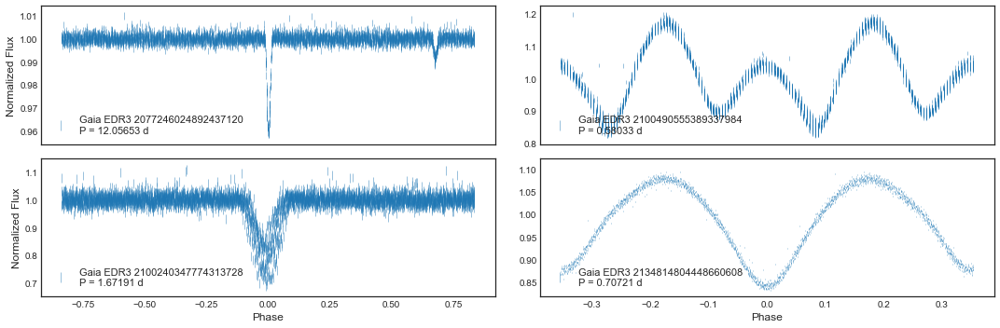

In [534]:
results = []

with plt.style.context('seaborn-white'):
    fig, ax = plt.subplots(2,2, figsize=(15,5))

    for i, (name, clc) in enumerate(clcs.items()):
        print(name)
        aux_p  = ebs.loc[name, "BLS_period"]
        aux_t0 = ebs.loc[name, "BLS_duration"]
        res, axis = do_periodogram(clc, pmin=aux_p * 0.9, pmax=aux_p * 1.1, dur0=None, method="bls", ax=ax.ravel()[i])
        
        results.append(res)
        if i in [0, 1]:
            axis.set_xlabel("")
            axis.axes.xaxis.set_visible(False)
        else:
            axis.set_xlabel("Phase", fontsize=12)
        if i in [1, 3]:
            axis.set_ylabel("")
        else:
            axis.set_ylabel("Normalized Flux", fontsize=12)
            
        # if i == 5:
        #     axis.set_xticklabels(["" ,-3, -2, -1, 0, 1, 2, 3])
            
    fig.tight_layout()
    plt.subplots_adjust(wspace=0.1, hspace=0.1)    
    # plt.savefig("../data/figures/paper/ebs.pdf", format="pdf", bbox_inches="tight")
    plt.show()
    
results_df = pd.DataFrame(results)

Gaia EDR3 2077246024892437120


/Users/jorgemarpa/.pyenv/versions/adap/lib/python3.8/site-packages/lightkurve/lightcurve.py:876: LightkurveWarning: `epoch_time` appears to be given in JD, however the light curve time uses BKJD (i.e. JD - 2454833).
  warnings.warn(


Gaia EDR3 2100490555389337984


/Users/jorgemarpa/.pyenv/versions/adap/lib/python3.8/site-packages/lightkurve/lightcurve.py:876: LightkurveWarning: `epoch_time` appears to be given in JD, however the light curve time uses BKJD (i.e. JD - 2454833).
  warnings.warn(


Gaia EDR3 2100240347774313728


/Users/jorgemarpa/.pyenv/versions/adap/lib/python3.8/site-packages/lightkurve/lightcurve.py:876: LightkurveWarning: `epoch_time` appears to be given in JD, however the light curve time uses BKJD (i.e. JD - 2454833).
  warnings.warn(


Gaia EDR3 2101753619371695872


/Users/jorgemarpa/.pyenv/versions/adap/lib/python3.8/site-packages/lightkurve/lightcurve.py:876: LightkurveWarning: `epoch_time` appears to be given in JD, however the light curve time uses BKJD (i.e. JD - 2454833).
  warnings.warn(


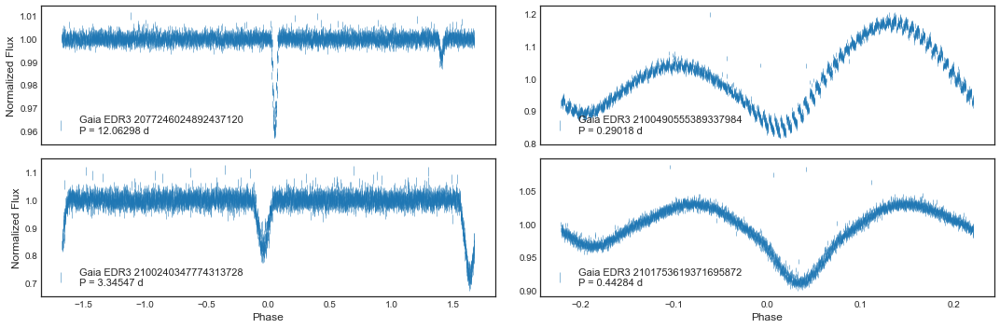

In [573]:
results = []

with plt.style.context('seaborn-white'):
    fig, ax = plt.subplots(2,2, figsize=(15,5))

    for i, (name, clc) in enumerate(clcs.items()):
        print(name)
        period = ebs.loc[name, "BLS_period"]
        t0     = ebs.loc[name, "BLS_transit_time"]
        clc = clc.remove_outliers(sigma_lower=1e10, sigma_upper=3).normalize()
        
        if clc.label in ["Gaia EDR3 2100240347774313728"]:
            period *= 2
        if clc.label in ["Gaia EDR3 2100490555389337984", "Gaia EDR3 2101753619371695872"]:
            period *= 0.5
        
        fclc = clc.fold(
            period=period,
            epoch_time=t0,
        )
        info = "%s \nP = %.5f d" % (clc.label, period)

        axis = fclc.errorbar(alpha=1, c='tab:blue', label=info, ax=ax.ravel()[i], rasterized=False)

        axis.legend(loc="lower left", fontsize=11)
        
        results.append(res)
        if i in [0, 1]:
            axis.set_xlabel("")
            axis.axes.xaxis.set_visible(False)
        else:
            axis.set_xlabel("Phase", fontsize=12)
        if i in [1, 3]:
            axis.set_ylabel("")
        else:
            axis.set_ylabel("Normalized Flux", fontsize=12)
            
        # if i == 5:
        #     axis.set_xticklabels(["" ,-3, -2, -1, 0, 1, 2, 3])
            
    fig.tight_layout()
    plt.subplots_adjust(wspace=0.1, hspace=0.1)    
    plt.savefig("../data/figures/paper/ebs.pdf", format="pdf", bbox_inches="tight")
    plt.show()
    
results_df = pd.DataFrame(results)

In [574]:
results_df["t0"] -= 2400000
print(results_df.to_latex())

\begin{tabular}{llrrrr}
\toprule
{} &                    designation &    period &            t0 &  duration &     depth \\
\midrule
0 &  Gaia EDR3 2134814804448660608 &  0.707214 &  55276.986213 &    0.1403 &  0.119283 \\
1 &  Gaia EDR3 2134814804448660608 &  0.707214 &  55276.986213 &    0.1403 &  0.119283 \\
2 &  Gaia EDR3 2134814804448660608 &  0.707214 &  55276.986213 &    0.1403 &  0.119283 \\
3 &  Gaia EDR3 2134814804448660608 &  0.707214 &  55276.986213 &    0.1403 &  0.119283 \\
\bottomrule
\end{tabular}



In [566]:
ebs_cand

,BLS_period,BLS_period_SNR,BLS_duration,BLS_depth,BLS_transit_time,channel,quarter,ra,dec
designation,,,,,,,,,
Gaia EDR3 2104814389164263168,0.595171,1497.167118,0.051,0.043160,2.455277e+06,3,5,281.863289,42.639542
Gaia EDR3 2100490555389337984,0.580361,1095.924153,0.051,0.111263,2.455277e+06,9,5,286.659364,39.717271
Gaia EDR3 2100240347774313728,1.672736,335.224454,0.099,0.109797,2.455277e+06,12,5,285.514700,39.099597
Gaia EDR3 2107265956496766208,0.604584,15434.251611,0.450,0.050878,2.455277e+06,17,5,285.191785,46.000274
Gaia EDR3 2107266536313762816,1.640355,2427.490416,0.099,0.126843,2.455277e+06,17,5,285.176035,46.016328
...,...,...,...,...,...,...,...,...,...
Gaia EDR3 2127956149696086272,0.601936,193.257546,0.399,0.019349,2.455373e+06,45,6,293.828766,45.208002
Gaia EDR3 2073682640842559360,0.707867,1098.842939,0.126,0.059683,2.455464e+06,16,7,297.643417,40.232566
Gaia EDR3 2077245814431169792,0.637804,1289.253464,0.051,0.321825,2.455464e+06,17,7,295.916197,42.741738


In [572]:
ebs_aux_df = ebs_cand.copy()
ebs_aux_df["BLS_transit_time"] -= 2400000
ebs_aux_df["BLS_depth"] *= 100
print(ebs_aux_df.loc[:, ["BLS_period", "BLS_transit_time", "BLS_duration", "BLS_depth"]].sort_index().to_latex())

\begin{tabular}{lrrrr}
\toprule
{} &  BLS\_period &  BLS\_transit\_time &  BLS\_duration &  BLS\_depth \\
designation                   &             &                   &               &            \\
\midrule
Gaia EDR3 2051774184464360064 &    0.816420 &      55276.893508 &         0.099 &   1.030747 \\
Gaia EDR3 2051871182004752512 &    0.531408 &      55276.762933 &         0.450 &   2.848130 \\
Gaia EDR3 2052499488484831616 &    0.523529 &      55463.445491 &         0.450 &   6.528912 \\
Gaia EDR3 2052503164977145088 &    0.551766 &      55276.795923 &         0.450 &   0.104680 \\
Gaia EDR3 2052503164977145472 &    0.551766 &      55276.795923 &         0.450 &  12.661261 \\
Gaia EDR3 2052524429346526464 &    0.969631 &      55373.414513 &         0.099 &   9.448619 \\
Gaia EDR3 2053614118393506176 &    0.532076 &      55276.725578 &         0.099 &  18.842998 \\
Gaia EDR3 2053614182812468480 &    0.532076 &      55276.725578 &         0.099 &   0.997837 \\
Gaia EDR3 20736084281

# Check all EBs

In [495]:
ap_names = np.array(["O", 1, 2 ,3 ,4, 5, 6 ,7])

stamps_dict = {}
catalogs_dict = {}

def plot_highlights(table, do_interact=False, aperture="7"):
    user = []
    for gid, row, in table.iterrows():
        print(row)
        fname = "../data/export/%i/%02i/lc_q%i_ch%02i_%s.fits.gz" % (row.quarter, row.channel, row.quarter, row.channel, gid.replace(" ", "_"))
        try:
            lc = lk.KeplerLightCurve.read(fname)
        except FileNotFoundError:
            print("No file: ", fname)
            continue
            
        FLFRCSAP = lc.meta["FLFRSAP%s" % (str(aperture))]
        CROWDSAP = lc.meta["CRWDSAP%s" % (str(aperture))]
        new_lc = lc.copy()
        ext = aperture if aperture != "O" else ""
        new_lc.flux = lc["flux%s" % str(ext)]
        new_lc.flux_err = lc["flux_err%s" % str(ext)]
        for ap in range(1, 8):
            if ap == aperture:
                continue
            new_lc.remove_columns(["flux%s" % str(ap), "flux_err%s" % str(ap)])

        new_lc.flux = (new_lc.flux.value - (1 - CROWDSAP) * np.median(new_lc.flux.value)) * lc.flux.unit
        
        k = 0 if aperture == "O" else int(aperture)
        ap_mask = fits.open(fname)[k + 2].data
        lc = new_lc    
        clc = correct_lc(lc, plot=False)
        
        key = "%i_%i" % (row.quarter, row.channel)
        if not key in stamps_dict.keys():
            hdu = fits.open("../data/export/%i/%02i/image_q%i_ch%02i_gaiadr3.fits.gz" % (row.quarter, row.channel, row.quarter, row.channel))
            hdr = hdu[0].header
            img = hdu[1].data
            cat = Table(hdu[2].data).to_pandas()
            cat["channel"] = ch
            catalogs_dict[key] = cat
            stamps_dict[key] = img
        
        fig = plt.figure(figsize=(13, 7))
        sub1 = fig.add_subplot(2, 3, (1,3))
        sub1.set_title("Q % i Ch %i      " % (row.quarter, row.channel) + clc.label)
        lc.normalize().plot(ax=sub1, c="k", label="Raw")
        clc.normalize().plot(ax=sub1, c="tab:blue", label="Corrected")

        sub2 = fig.add_subplot(2, 3, (4,5))
        folded_clc = clc.remove_outliers(sigma_upper=5, 
                                         sigma_lower=1e10).fold(row.BLS_period)
        info = "\nP = %.4f  \nSNR = %.0f \nDepth = %.5f" % (row.BLS_period, row.BLS_period_SNR, row.BLS_depth)
        folded_clc.normalize().scatter(ax=sub2, alpha=.5, c='k', marker='.', 
                                       label=info)

        sub3 = fig.add_subplot(2, 3, 6)
        sub3.set_title("FLFRCSAP    %.3f \nCROWDSAP %.3f" % 
                       (FLFRCSAP, CROWDSAP),
                  fontsize=12,
                  bbox=dict(facecolor='white', alpha=1))
        
        
        plot_stamp(stamps_dict[key], catalogs_dict[key], i, 
                   aperture=ap_mask, ax=sub3, row0=558, col0=556)

        plt.show()

        #whatis = input("What type of variable ([E]cl, [S]in, [A]ct, [F]alse): ")
        #user.append(whatis)
        print("___________________________________________________")
        # break
    return

In [513]:
ebs_cand.sort_values(["quarter", "channel"], inplace=True)
ebs_cand

,BLS_period,BLS_period_SNR,BLS_duration,BLS_depth,BLS_transit_time,channel,quarter,ra,dec
designation,,,,,,,,,
Gaia EDR3 2104814389164263168,0.595171,1497.167118,0.051,0.043160,2.455277e+06,3,5,281.863289,42.639542
Gaia EDR3 2100490555389337984,0.580361,1095.924153,0.051,0.111263,2.455277e+06,9,5,286.659364,39.717271
Gaia EDR3 2100240347774313728,1.672736,335.224454,0.099,0.109797,2.455277e+06,12,5,285.514700,39.099597
Gaia EDR3 2107265956496766208,0.604584,15434.251611,0.450,0.050878,2.455277e+06,17,5,285.191785,46.000274
Gaia EDR3 2107266536313762816,1.640355,2427.490416,0.099,0.126843,2.455277e+06,17,5,285.176035,46.016328
...,...,...,...,...,...,...,...,...,...
Gaia EDR3 2127956149696086272,0.601936,193.257546,0.399,0.019349,2.455373e+06,45,6,293.828766,45.208002
Gaia EDR3 2073682640842559360,0.707867,1098.842939,0.126,0.059683,2.455464e+06,16,7,297.643417,40.232566
Gaia EDR3 2077245814431169792,0.637804,1289.253464,0.051,0.321825,2.455464e+06,17,7,295.916197,42.741738


BLS_period          5.951715e-01
BLS_period_SNR      1.497167e+03
BLS_duration        5.100000e-02
BLS_depth           4.316045e-02
BLS_transit_time    2.455277e+06
channel             3.000000e+00
quarter             5.000000e+00
ra                  2.818633e+02
dec                 4.263954e+01
Name: Gaia EDR3 2104814389164263168, dtype: float64


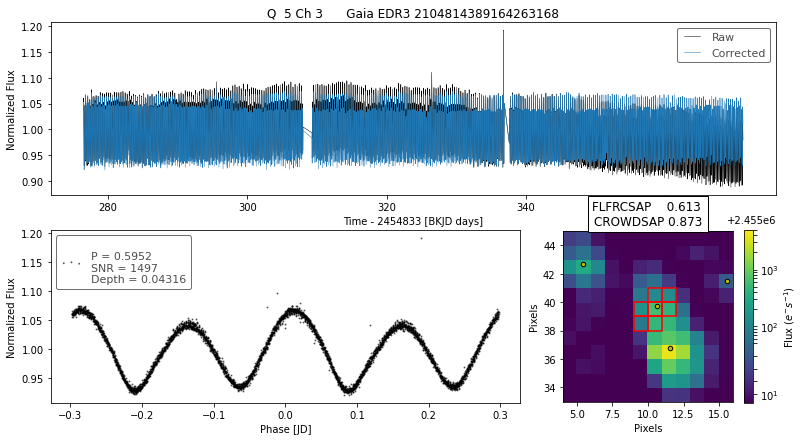

___________________________________________________
BLS_period          5.803609e-01
BLS_period_SNR      1.095924e+03
BLS_duration        5.100000e-02
BLS_depth           1.112633e-01
BLS_transit_time    2.455277e+06
channel             9.000000e+00
quarter             5.000000e+00
ra                  2.866594e+02
dec                 3.971727e+01
Name: Gaia EDR3 2100490555389337984, dtype: float64


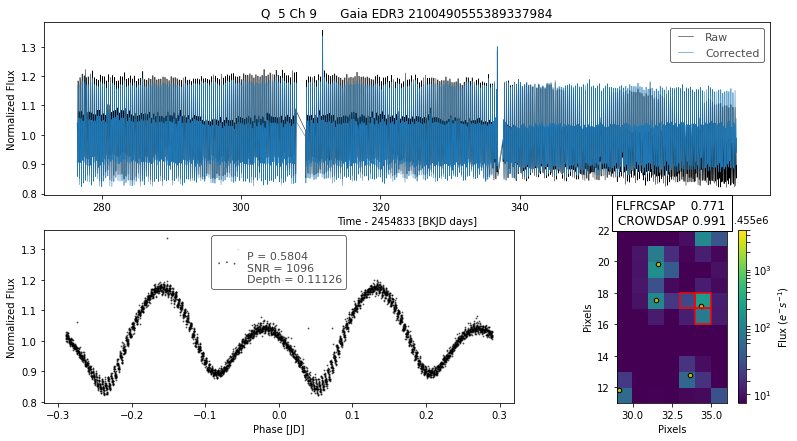

___________________________________________________
BLS_period          1.672736e+00
BLS_period_SNR      3.352245e+02
BLS_duration        9.900000e-02
BLS_depth           1.097965e-01
BLS_transit_time    2.455277e+06
channel             1.200000e+01
quarter             5.000000e+00
ra                  2.855147e+02
dec                 3.909960e+01
Name: Gaia EDR3 2100240347774313728, dtype: float64


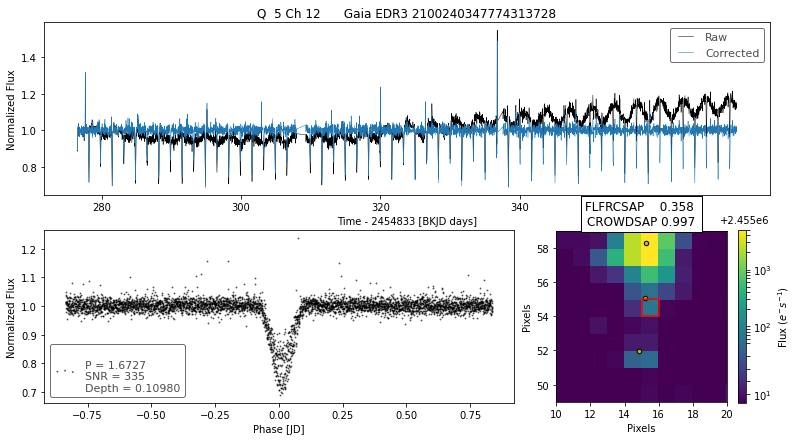

___________________________________________________
BLS_period          6.045844e-01
BLS_period_SNR      1.543425e+04
BLS_duration        4.500000e-01
BLS_depth           5.087825e-02
BLS_transit_time    2.455277e+06
channel             1.700000e+01
quarter             5.000000e+00
ra                  2.851918e+02
dec                 4.600027e+01
Name: Gaia EDR3 2107265956496766208, dtype: float64


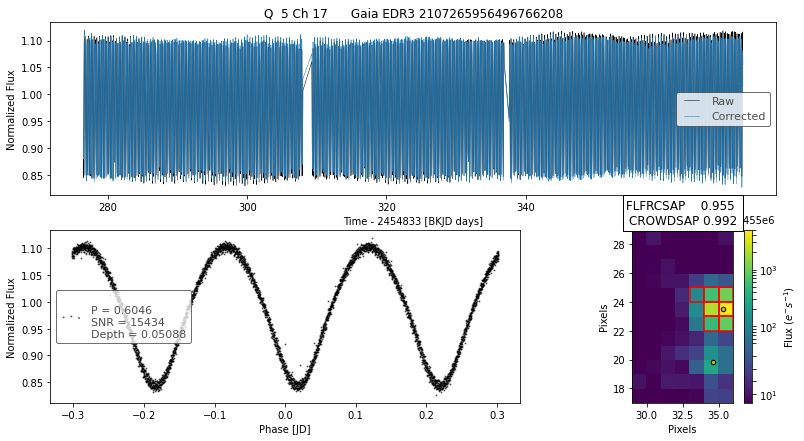

___________________________________________________
BLS_period          1.640355e+00
BLS_period_SNR      2.427490e+03
BLS_duration        9.900000e-02
BLS_depth           1.268428e-01
BLS_transit_time    2.455277e+06
channel             1.700000e+01
quarter             5.000000e+00
ra                  2.851760e+02
dec                 4.601633e+01
Name: Gaia EDR3 2107266536313762816, dtype: float64


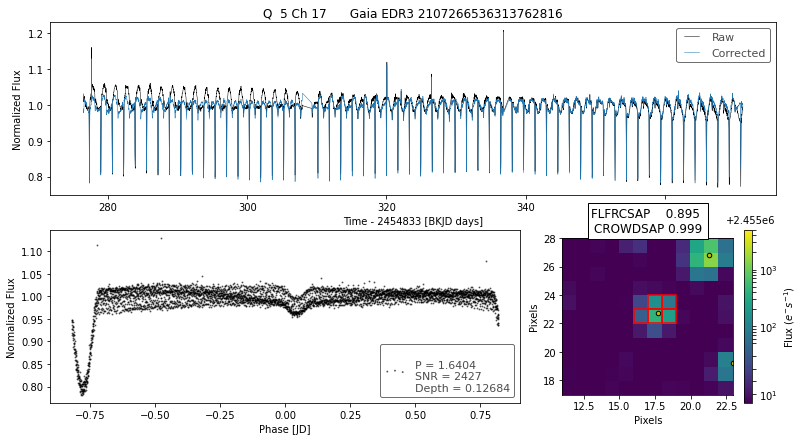

___________________________________________________
BLS_period          2.054448e+01
BLS_period_SNR      3.635675e+02
BLS_duration        4.500000e-01
BLS_depth           5.975260e-02
BLS_transit_time    2.455297e+06
channel             1.800000e+01
quarter             5.000000e+00
ra                  2.861507e+02
dec                 4.504803e+01
Name: Gaia EDR3 2106327622103110784, dtype: float64


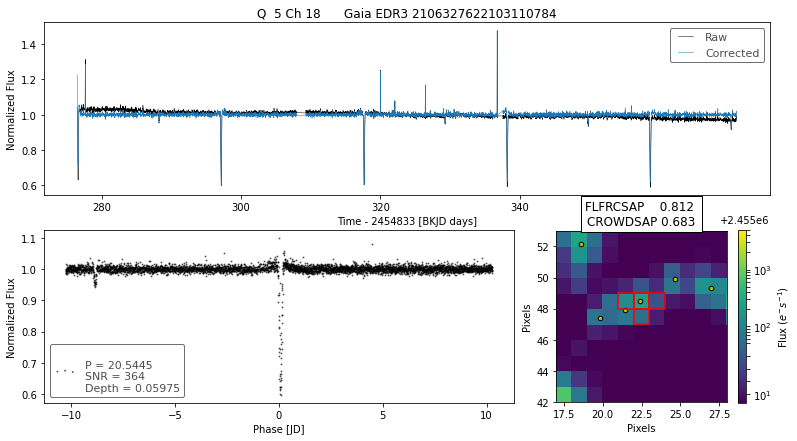

___________________________________________________
BLS_period          1.481648e+00
BLS_period_SNR      5.202924e+02
BLS_duration        9.900000e-02
BLS_depth           3.322106e-02
BLS_transit_time    2.455277e+06
channel             2.200000e+01
quarter             5.000000e+00
ra                  2.884724e+02
dec                 4.270924e+01
Name: Gaia EDR3 2102900959754861440, dtype: float64


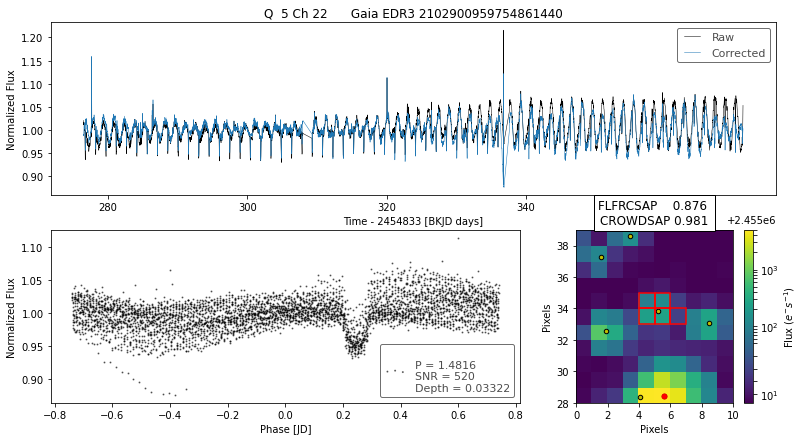

___________________________________________________
BLS_period          7.526099e-01
BLS_period_SNR      5.274043e+02
BLS_duration        4.500000e-01
BLS_depth           1.506718e-02
BLS_transit_time    2.455277e+06
channel             2.700000e+01
quarter             5.000000e+00
ra                  2.906483e+02
dec                 4.040228e+01
Name: Gaia EDR3 2101136415390982528, dtype: float64


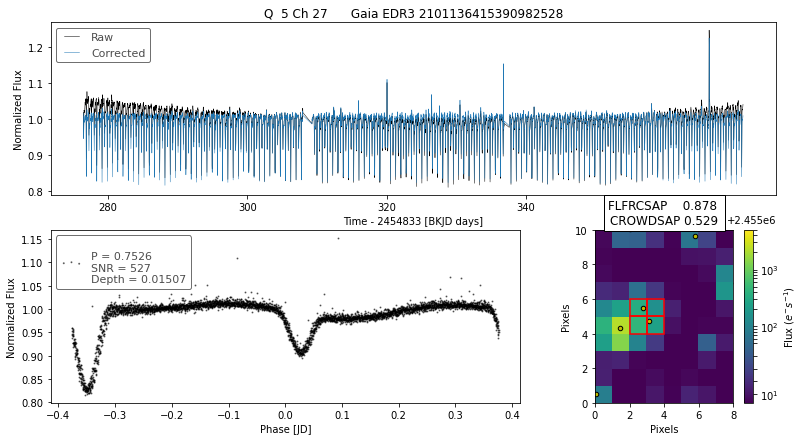

___________________________________________________
BLS_period          7.526099e-01
BLS_period_SNR      7.088490e+02
BLS_duration        4.500000e-01
BLS_depth           1.984499e-02
BLS_transit_time    2.455277e+06
channel             2.700000e+01
quarter             5.000000e+00
ra                  2.906480e+02
dec                 4.040323e+01
Name: Gaia EDR3 2101136419694167040, dtype: float64


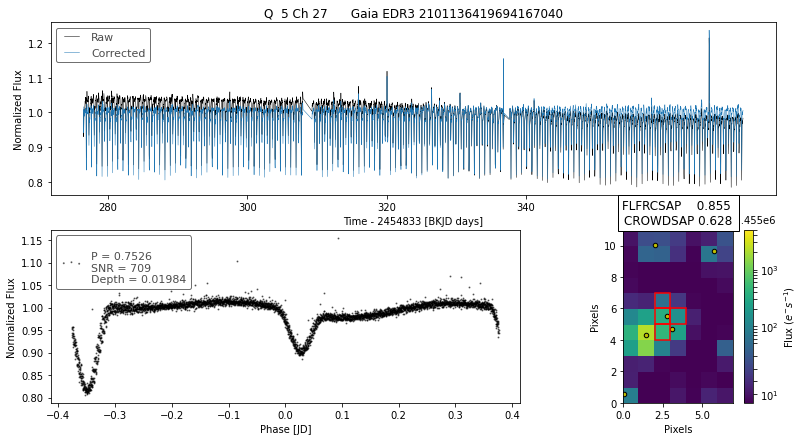

___________________________________________________
BLS_period          3.734361e+00
BLS_period_SNR      3.631199e+02
BLS_duration        5.100000e-02
BLS_depth           6.638635e-02
BLS_transit_time    2.455280e+06
channel             2.800000e+01
quarter             5.000000e+00
ra                  2.893097e+02
dec                 3.974587e+01
Name: Gaia EDR3 2101033920292227584, dtype: float64


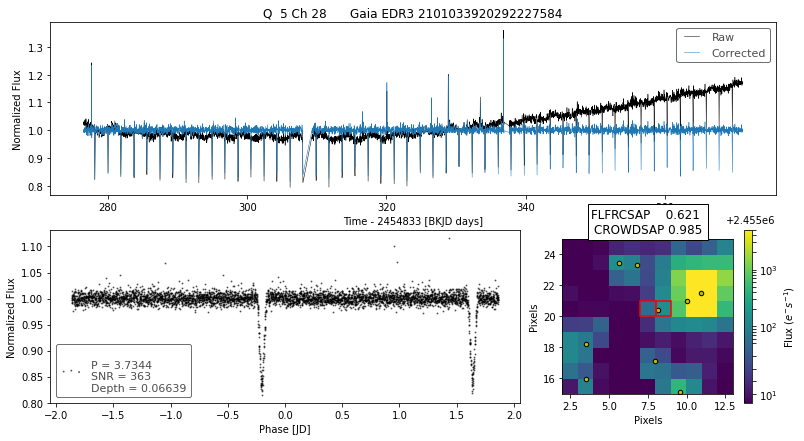

___________________________________________________
BLS_period          5.314085e-01
BLS_period_SNR      6.331522e+02
BLS_duration        4.500000e-01
BLS_depth           2.848130e-02
BLS_transit_time    2.455277e+06
channel             3.100000e+01
quarter             5.000000e+00
ra                  2.925807e+02
dec                 3.800591e+01
Name: Gaia EDR3 2051871182004752512, dtype: float64


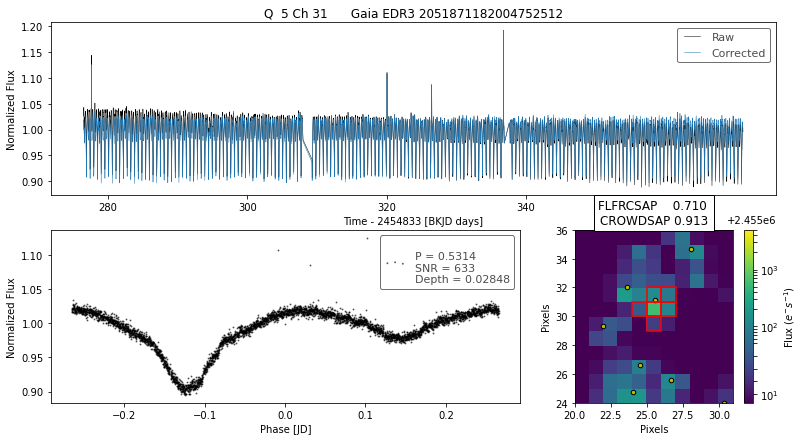

___________________________________________________
BLS_period          8.164204e-01
BLS_period_SNR      1.948292e+02
BLS_duration        9.900000e-02
BLS_depth           1.030747e-02
BLS_transit_time    2.455277e+06
channel             3.200000e+01
quarter             5.000000e+00
ra                  2.913356e+02
dec                 3.738856e+01
Name: Gaia EDR3 2051774184464360064, dtype: float64


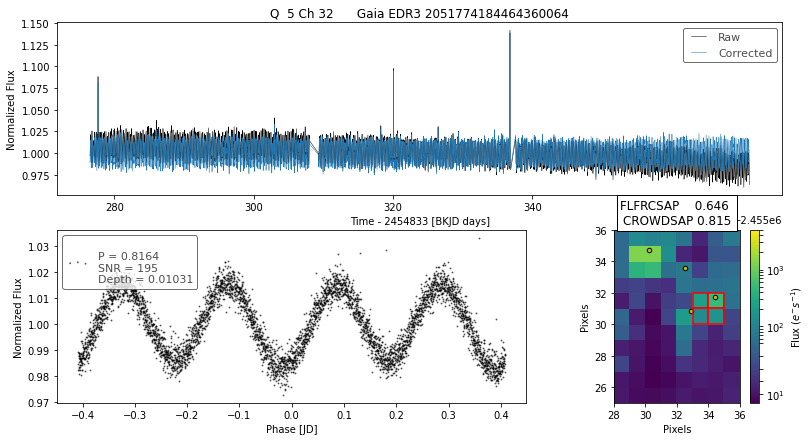

___________________________________________________
BLS_period          9.850358e-01
BLS_period_SNR      6.712463e+01
BLS_duration        1.740000e-01
BLS_depth           2.357031e-02
BLS_transit_time    2.455277e+06
channel             3.600000e+01
quarter             5.000000e+00
ra                  2.861429e+02
dec                 5.003165e+01
Name: Gaia EDR3 2133602451140200192, dtype: float64


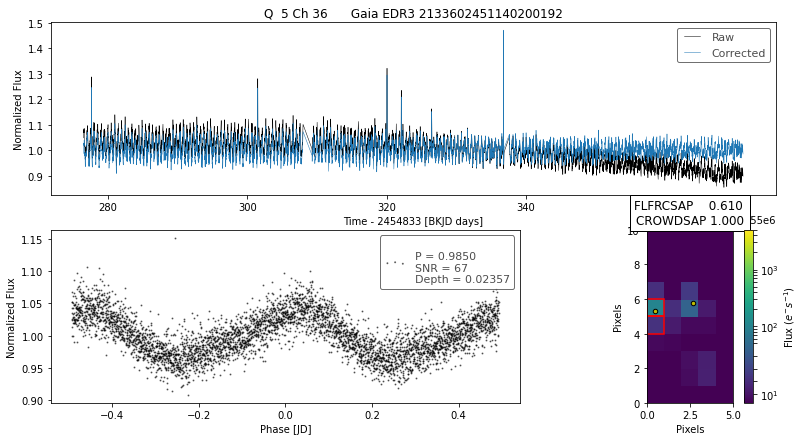

___________________________________________________
BLS_period          2.523513e+01
BLS_period_SNR      2.292970e+03
BLS_duration        2.490000e-01
BLS_depth           3.355718e-02
BLS_transit_time    2.455293e+06
channel             4.000000e+01
quarter             5.000000e+00
ra                  2.886748e+02
dec                 4.763598e+01
Name: Gaia EDR3 2130912843839236224, dtype: float64


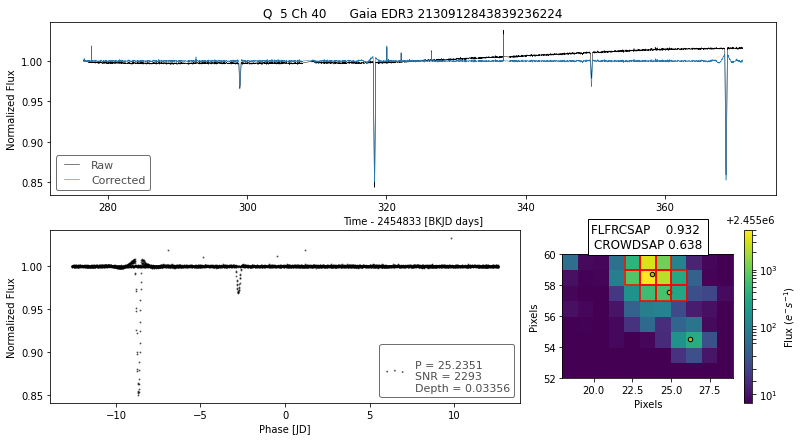

___________________________________________________
BLS_period          5.523658e-01
BLS_period_SNR      7.114184e+03
BLS_duration        5.100000e-02
BLS_depth           9.413652e-02
BLS_transit_time    2.455277e+06
channel             4.500000e+01
quarter             5.000000e+00
ra                  2.916903e+02
dec                 4.221678e+01
Name: Gaia EDR3 2101752936479788544, dtype: float64


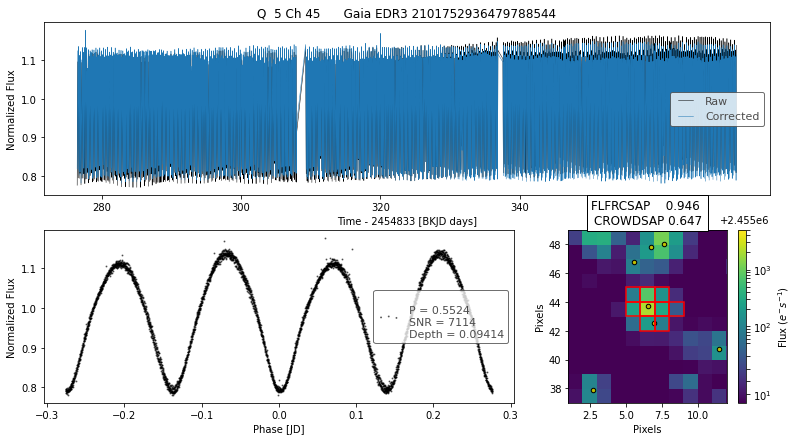

___________________________________________________
BLS_period          5.306874e-01
BLS_period_SNR      2.158725e+03
BLS_duration        4.500000e-01
BLS_depth           7.978087e-02
BLS_transit_time    2.455277e+06
channel             4.500000e+01
quarter             5.000000e+00
ra                  2.917005e+02
dec                 4.225831e+01
Name: Gaia EDR3 2101753516292218624, dtype: float64


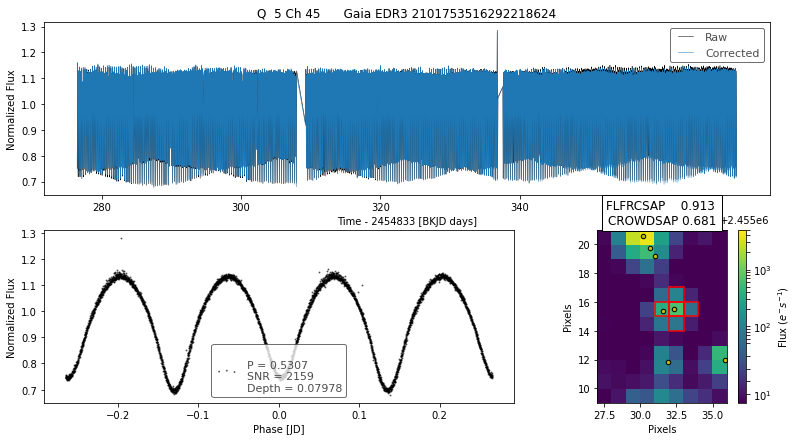

___________________________________________________
BLS_period          5.306874e-01
BLS_period_SNR      1.791842e+03
BLS_duration        4.500000e-01
BLS_depth           7.094880e-02
BLS_transit_time    2.455277e+06
channel             4.500000e+01
quarter             5.000000e+00
ra                  2.916994e+02
dec                 4.225802e+01
Name: Gaia EDR3 2101753520591885568, dtype: float64


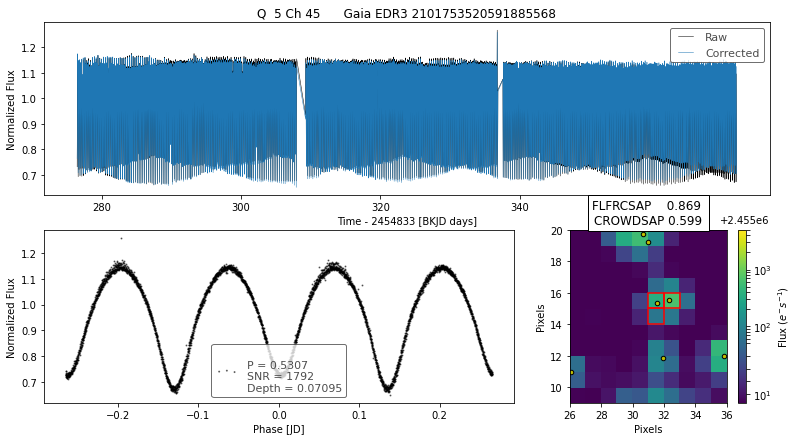

___________________________________________________
BLS_period          8.856824e-01
BLS_period_SNR      5.993456e+02
BLS_duration        9.900000e-02
BLS_depth           4.122006e-02
BLS_transit_time    2.455277e+06
channel             4.500000e+01
quarter             5.000000e+00
ra                  2.916680e+02
dec                 4.225997e+01
Name: Gaia EDR3 2101753619371695872, dtype: float64


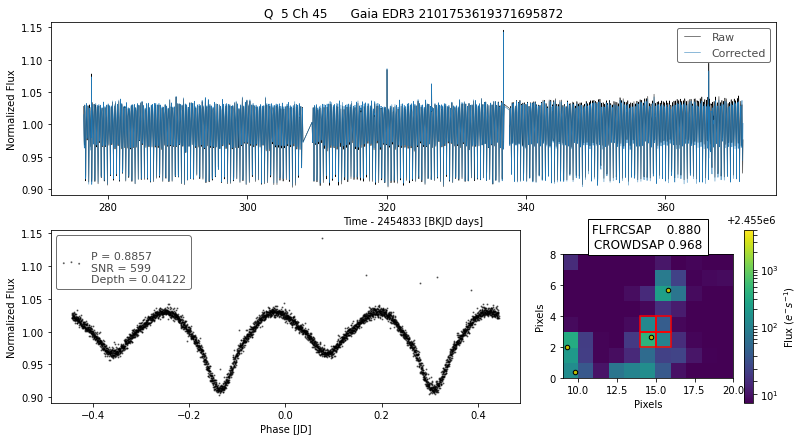

___________________________________________________
BLS_period          5.320759e-01
BLS_period_SNR      1.103561e+05
BLS_duration        9.900000e-02
BLS_depth           1.884300e-01
BLS_transit_time    2.455277e+06
channel             4.800000e+01
quarter             5.000000e+00
ra                  2.924850e+02
dec                 4.131559e+01
Name: Gaia EDR3 2053614118393506176, dtype: float64


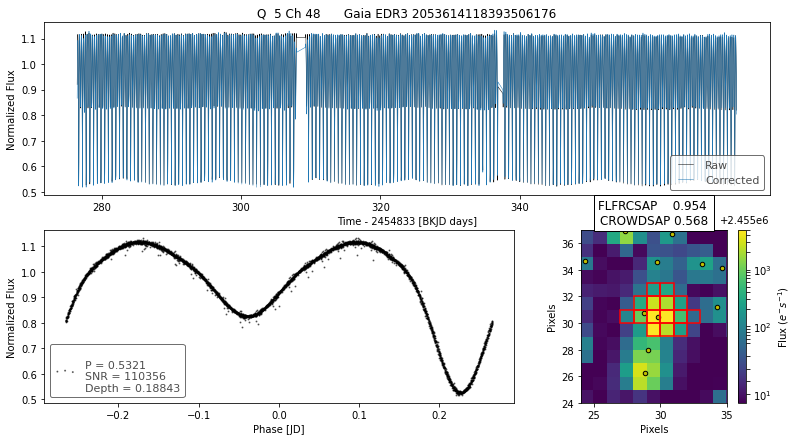

___________________________________________________
BLS_period          5.320759e-01
BLS_period_SNR      1.298707e+02
BLS_duration        9.900000e-02
BLS_depth           9.978370e-03
BLS_transit_time    2.455277e+06
channel             4.800000e+01
quarter             5.000000e+00
ra                  2.924817e+02
dec                 4.131942e+01
Name: Gaia EDR3 2053614182812468480, dtype: float64


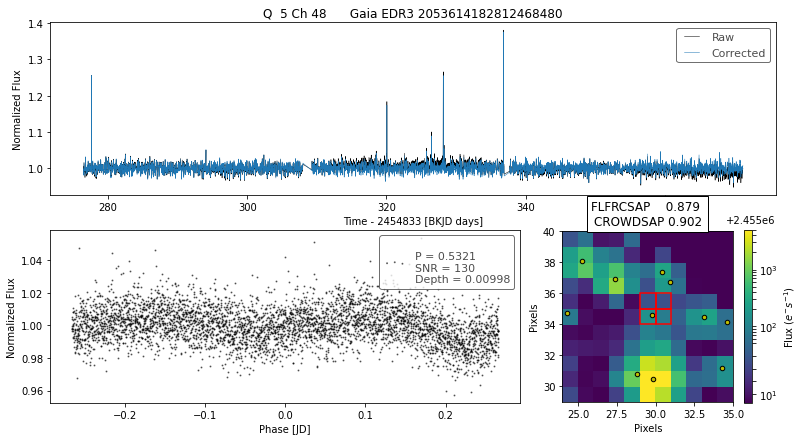

___________________________________________________
BLS_period          5.517664e-01
BLS_period_SNR      1.025880e+02
BLS_duration        4.500000e-01
BLS_depth           1.046804e-03
BLS_transit_time    2.455277e+06
channel             4.900000e+01
quarter             5.000000e+00
ra                  2.936665e+02
dec                 3.982012e+01
Name: Gaia EDR3 2052503164977145088, dtype: float64


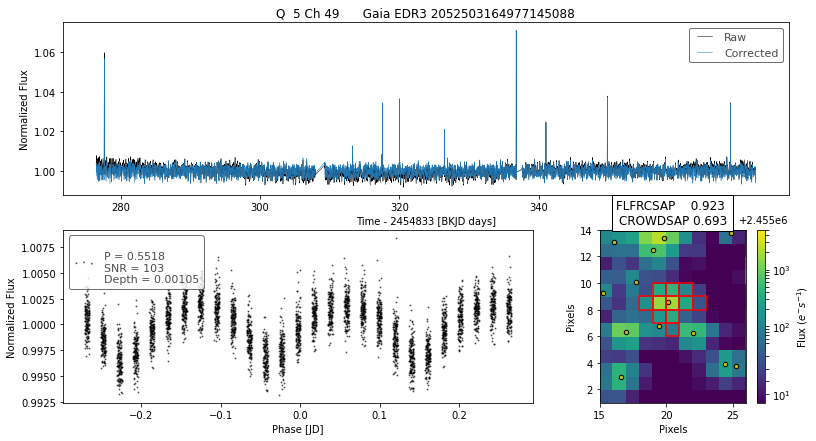

___________________________________________________
BLS_period          5.517664e-01
BLS_period_SNR      4.784072e+03
BLS_duration        4.500000e-01
BLS_depth           1.266126e-01
BLS_transit_time    2.455277e+06
channel             4.900000e+01
quarter             5.000000e+00
ra                  2.936671e+02
dec                 3.982344e+01
Name: Gaia EDR3 2052503164977145472, dtype: float64


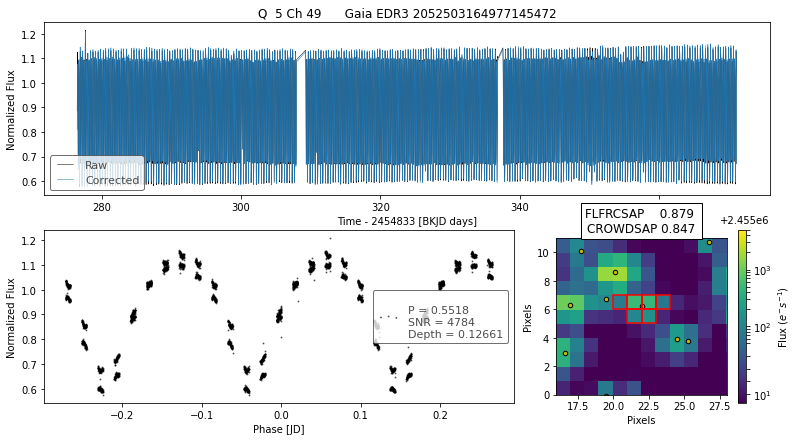

___________________________________________________
BLS_period          5.421177e-01
BLS_period_SNR      5.600997e+01
BLS_duration        4.500000e-01
BLS_depth           7.072533e-03
BLS_transit_time    2.455277e+06
channel             5.000000e+01
quarter             5.000000e+00
ra                  2.950188e+02
dec                 4.036816e+01
Name: Gaia EDR3 2076505018468886784, dtype: float64


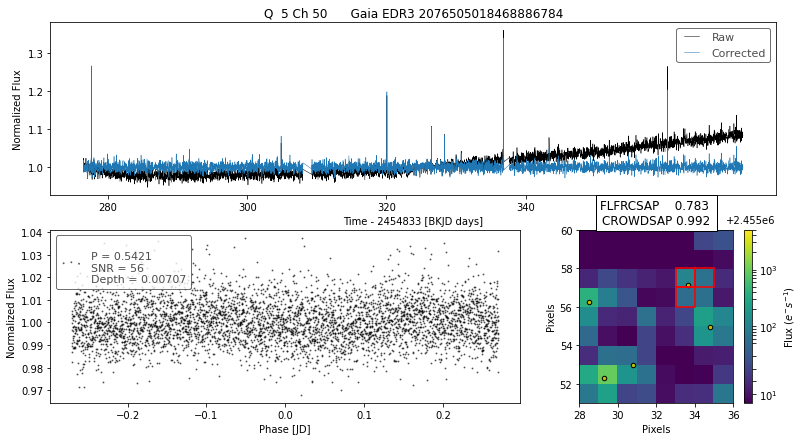

___________________________________________________
BLS_period          6.464815e-01
BLS_period_SNR      2.165483e+02
BLS_duration        3.990000e-01
BLS_depth           8.298459e-03
BLS_transit_time    2.455277e+06
channel             5.100000e+01
quarter             5.000000e+00
ra                  2.957425e+02
dec                 3.942931e+01
Name: Gaia EDR3 2076208292075451136, dtype: float64


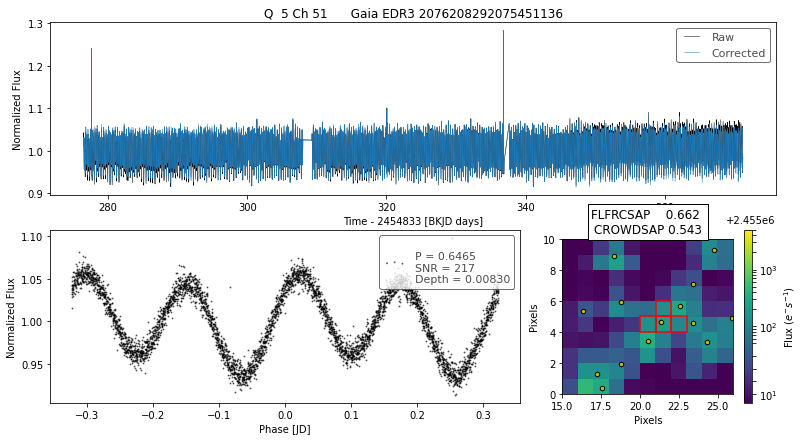

___________________________________________________
BLS_period          6.180336e-01
BLS_period_SNR      2.492413e+02
BLS_duration        3.990000e-01
BLS_depth           5.536100e-02
BLS_transit_time    2.455277e+06
channel             5.100000e+01
quarter             5.000000e+00
ra                  2.957255e+02
dec                 3.947699e+01
Name: Gaia EDR3 2076209357217808384, dtype: float64


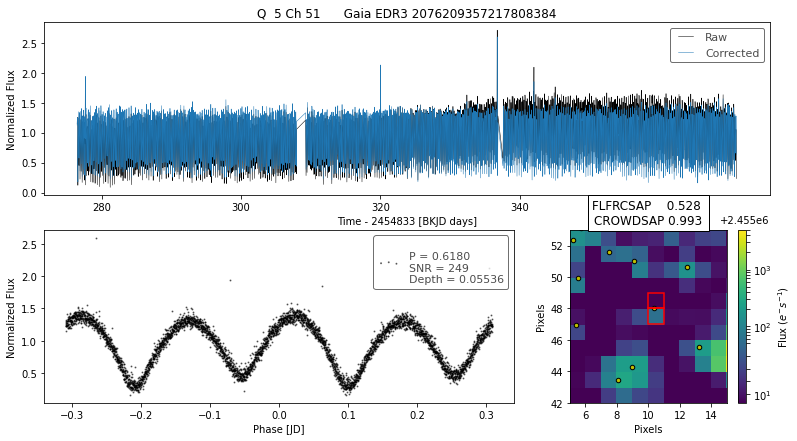

___________________________________________________
BLS_period          6.810999e+00
BLS_period_SNR      2.058811e+02
BLS_duration        1.500000e-01
BLS_depth           1.027946e-02
BLS_transit_time    2.455278e+06
channel             5.100000e+01
quarter             5.000000e+00
ra                  2.957503e+02
dec                 3.945949e+01
Name: Gaia EDR3 2076209456001789056, dtype: float64


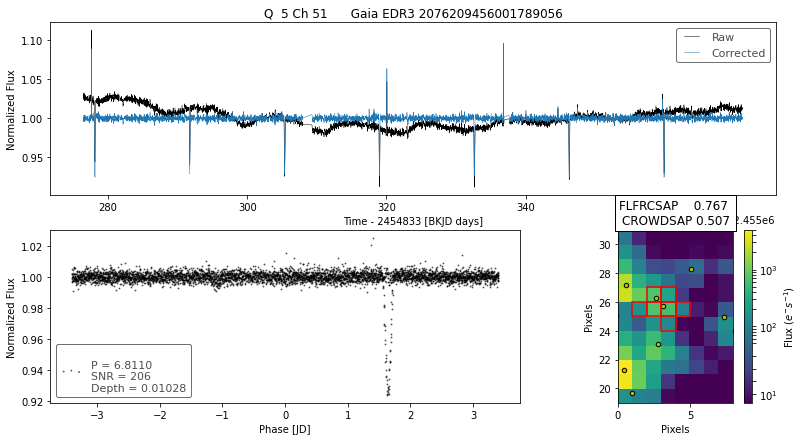

___________________________________________________
BLS_period          8.751630e-01
BLS_period_SNR      2.212475e+03
BLS_duration        4.500000e-01
BLS_depth           1.554462e-02
BLS_transit_time    2.455277e+06
channel             5.900000e+01
quarter             5.000000e+00
ra                  2.907370e+02
dec                 4.858317e+01
Name: Gaia EDR3 2129514093249096832, dtype: float64


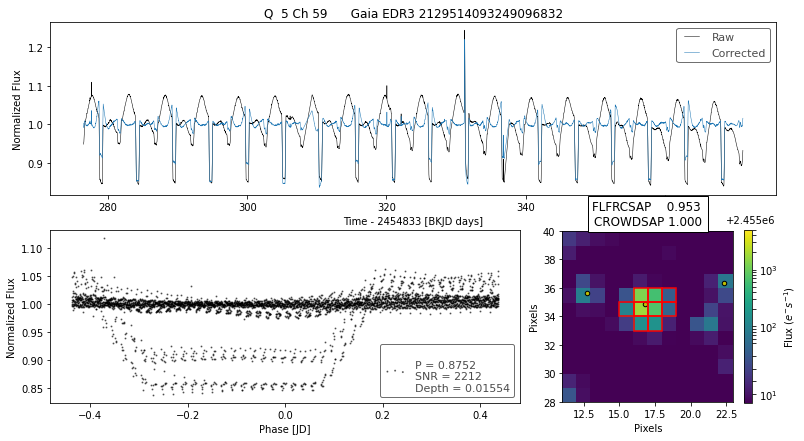

___________________________________________________
BLS_period          6.581133e-01
BLS_period_SNR      2.247629e+03
BLS_duration        5.100000e-02
BLS_depth           1.086778e-01
BLS_transit_time    2.455277e+06
channel             6.100000e+01
quarter             5.000000e+00
ra                  2.938830e+02
dec                 4.523842e+01
Name: Gaia EDR3 2127957734541969152, dtype: float64


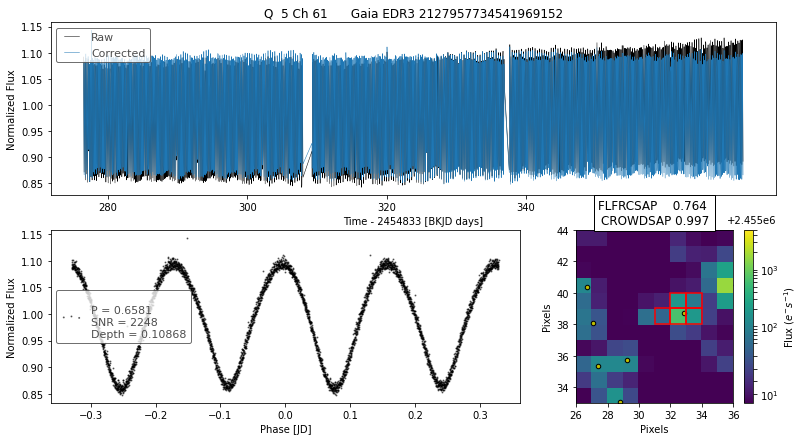

___________________________________________________
BLS_period          5.157225e-01
BLS_period_SNR      1.088518e+02
BLS_duration        5.100000e-02
BLS_depth           2.312619e-03
BLS_transit_time    2.455277e+06
channel             6.200000e+01
quarter             5.000000e+00
ra                  2.930200e+02
dec                 4.625092e+01
Name: Gaia EDR3 2128267968619535872, dtype: float64


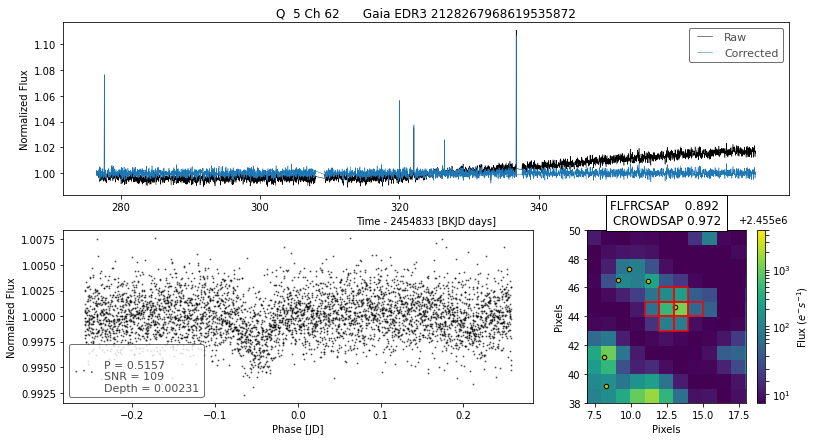

___________________________________________________
BLS_period          5.852377e-01
BLS_period_SNR      1.278573e+03
BLS_duration        4.500000e-01
BLS_depth           1.411582e-02
BLS_transit_time    2.455277e+06
channel             6.200000e+01
quarter             5.000000e+00
ra                  2.930078e+02
dec                 4.623807e+01
Name: Gaia EDR3 2128268587094813056, dtype: float64


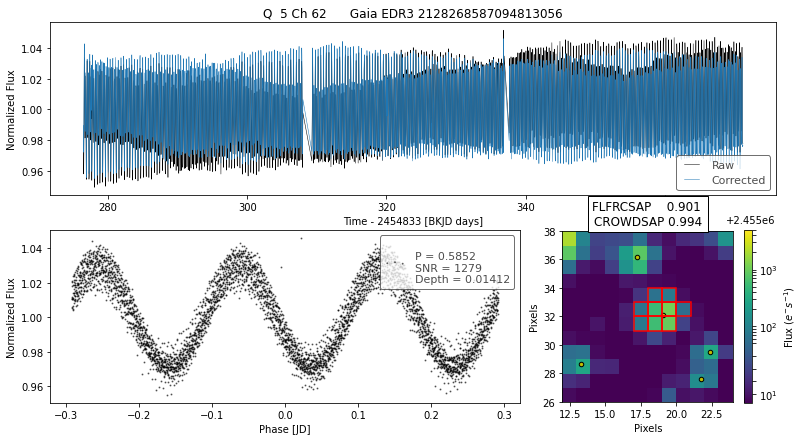

___________________________________________________
BLS_period          5.620131e-01
BLS_period_SNR      1.062781e+04
BLS_duration        4.500000e-01
BLS_depth           5.224848e-02
BLS_transit_time    2.455277e+06
channel             6.300000e+01
quarter             5.000000e+00
ra                  2.943784e+02
dec                 4.682046e+01
Name: Gaia EDR3 2128160285200885888, dtype: float64


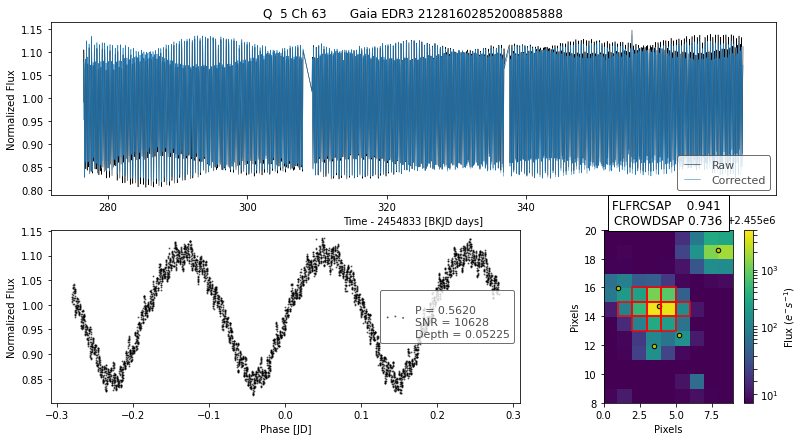

___________________________________________________
BLS_period          6.777650e-01
BLS_period_SNR      3.617485e+02
BLS_duration        2.010000e-01
BLS_depth           2.946191e-04
BLS_transit_time    2.455277e+06
channel             6.400000e+01
quarter             5.000000e+00
ra                  2.952473e+02
dec                 4.575739e+01
Name: Gaia EDR3 2080017648879407616, dtype: float64


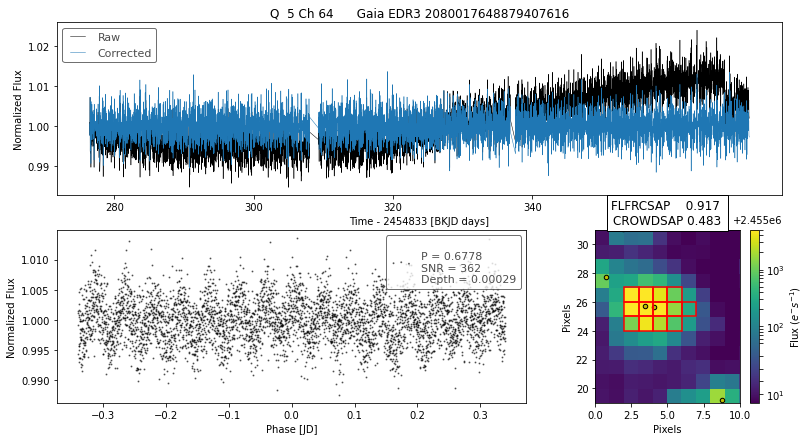

___________________________________________________
BLS_period          6.777650e-01
BLS_period_SNR      3.196504e+02
BLS_duration        2.010000e-01
BLS_depth           2.987843e-04
BLS_transit_time    2.455277e+06
channel             6.400000e+01
quarter             5.000000e+00
ra                  2.952469e+02
dec                 4.575802e+01
Name: Gaia EDR3 2080017653183613952, dtype: float64


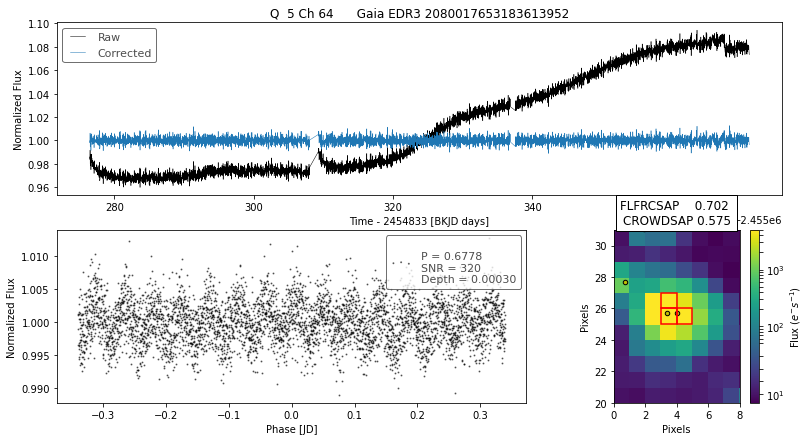

___________________________________________________
BLS_period          5.768709e-01
BLS_period_SNR      9.033911e+01
BLS_duration        4.500000e-01
BLS_depth           3.843253e-03
BLS_transit_time    2.455277e+06
channel             6.400000e+01
quarter             5.000000e+00
ra                  2.952015e+02
dec                 4.573603e+01
Name: Gaia EDR3 2079994181178267776, dtype: float64


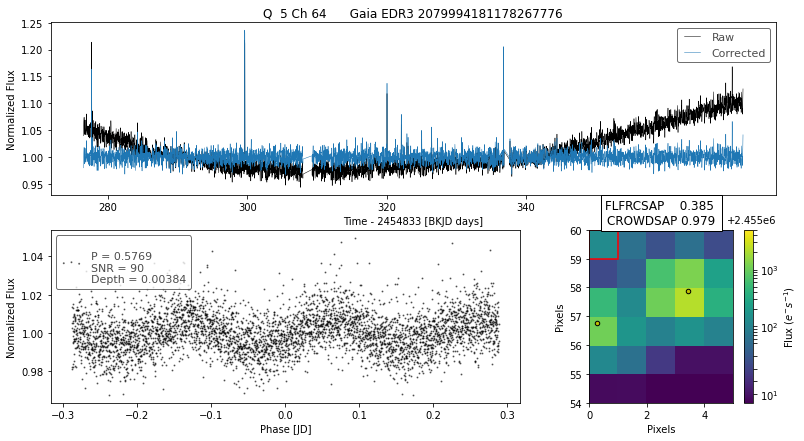

___________________________________________________
BLS_period          1.206298e+01
BLS_period_SNR      2.650248e+02
BLS_duration        4.500000e-01
BLS_depth           8.314335e-03
BLS_transit_time    2.455278e+06
channel             6.500000e+01
quarter             5.000000e+00
ra                  2.959042e+02
dec                 4.274681e+01
Name: Gaia EDR3 2077246024892437120, dtype: float64


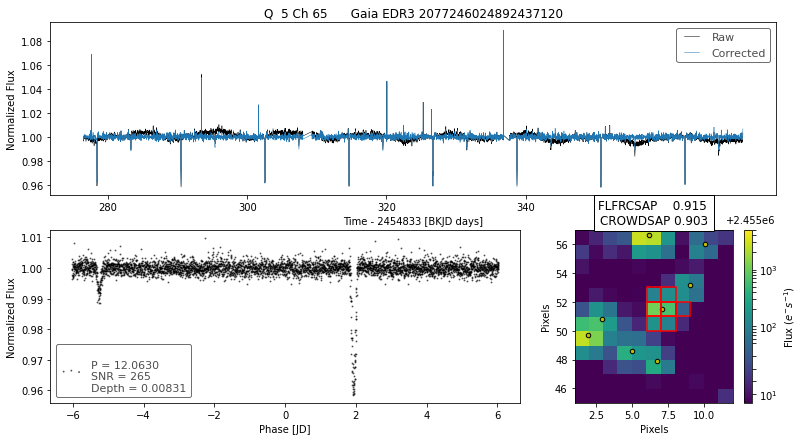

___________________________________________________
BLS_period          9.835114e-01
BLS_period_SNR      2.099743e+04
BLS_duration        9.900000e-02
BLS_depth           1.128064e-01
BLS_transit_time    2.455277e+06
channel             6.600000e+01
quarter             5.000000e+00
ra                  2.950130e+02
dec                 4.377306e+01
Name: Gaia EDR3 2078117181696007296, dtype: float64


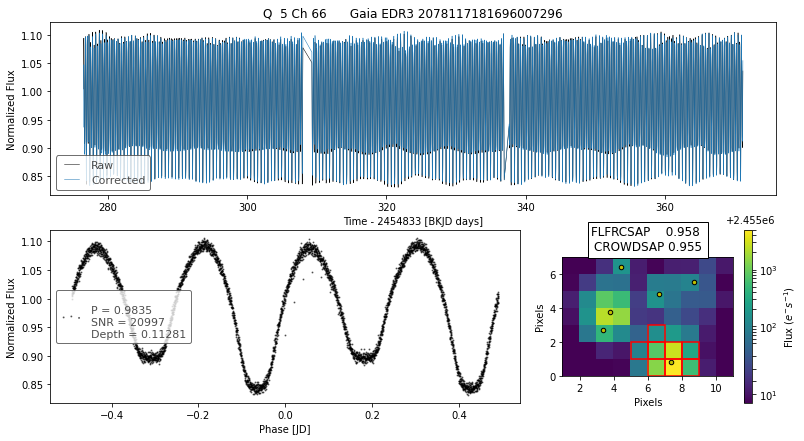

___________________________________________________
BLS_period          2.414770e+00
BLS_period_SNR      2.066955e+02
BLS_duration        1.740000e-01
BLS_depth           1.672115e-02
BLS_transit_time    2.455278e+06
channel             6.800000e+01
quarter             5.000000e+00
ra                  2.971913e+02
dec                 4.329041e+01
Name: Gaia EDR3 2078735858841858816, dtype: float64


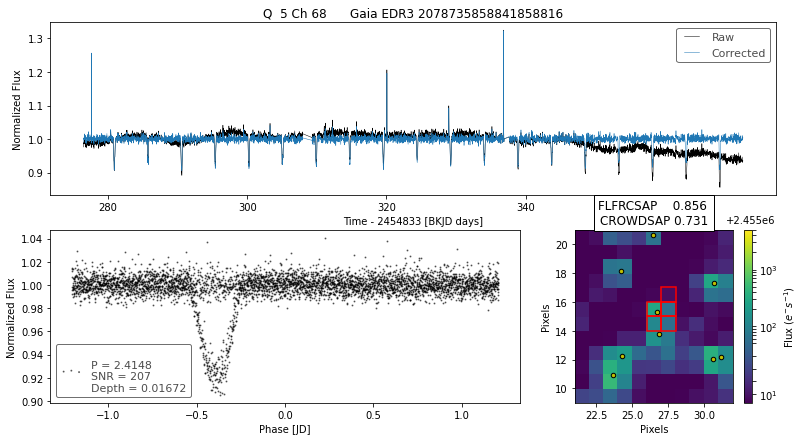

___________________________________________________
BLS_period          1.336288e+01
BLS_period_SNR      2.021752e+02
BLS_duration        4.500000e-01
BLS_depth           1.503108e-02
BLS_transit_time    2.455279e+06
channel             6.900000e+01
quarter             5.000000e+00
ra                  2.969213e+02
dec                 4.120526e+01
Name: Gaia EDR3 2076789723264283008, dtype: float64


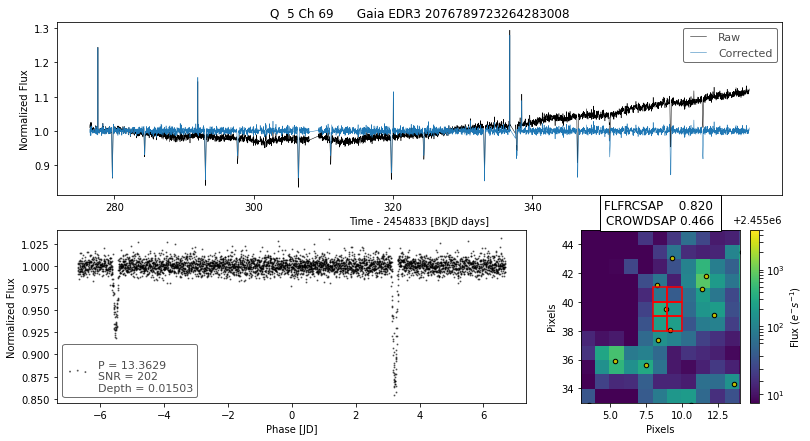

___________________________________________________
BLS_period          3.524663e+00
BLS_period_SNR      3.022011e+02
BLS_duration        4.500000e-01
BLS_depth           8.007654e-03
BLS_transit_time    2.455279e+06
channel             6.900000e+01
quarter             5.000000e+00
ra                  2.969142e+02
dec                 4.120680e+01
Name: Gaia EDR3 2076789727566520192, dtype: float64


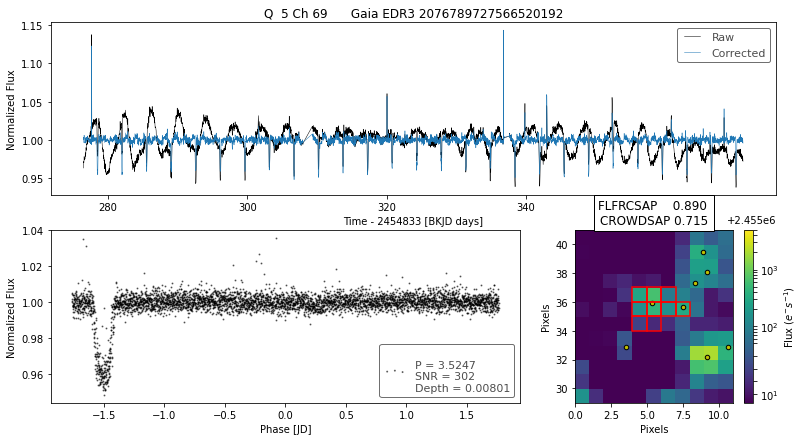

___________________________________________________
BLS_period          7.078671e-01
BLS_period_SNR      8.771126e+01
BLS_duration        1.260000e-01
BLS_depth           1.174416e-02
BLS_transit_time    2.455277e+06
channel             6.900000e+01
quarter             5.000000e+00
ra                  2.969133e+02
dec                 4.125001e+01
Name: Gaia EDR3 2076836864825475456, dtype: float64


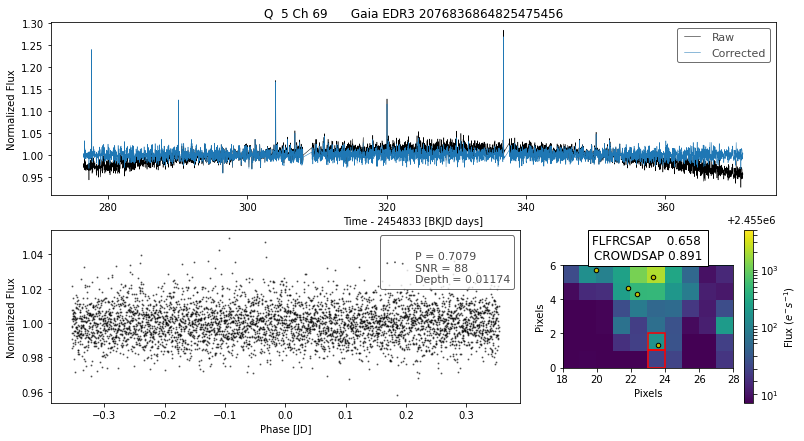

___________________________________________________
BLS_period          3.034506e+00
BLS_period_SNR      3.389711e+02
BLS_duration        3.300000e-01
BLS_depth           2.204107e-02
BLS_transit_time    2.455278e+06
channel             7.000000e+01
quarter             5.000000e+00
ra                  2.983388e+02
dec                 4.176166e+01
Name: Gaia EDR3 2075404789599593088, dtype: float64


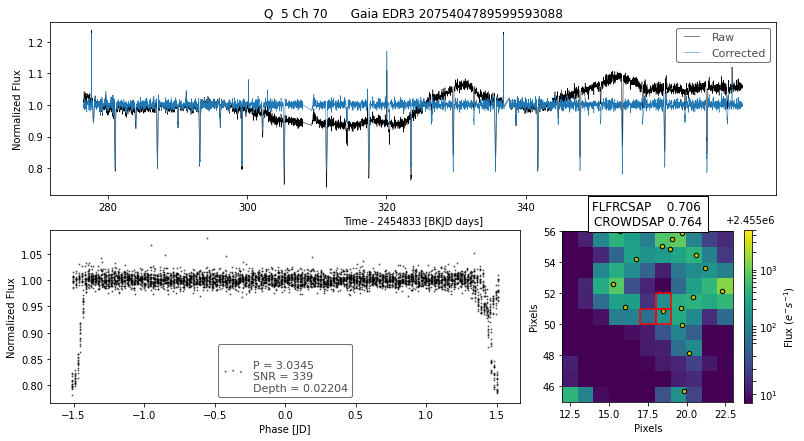

___________________________________________________
BLS_period          5.413673e-01
BLS_period_SNR      1.448511e+03
BLS_duration        4.500000e-01
BLS_depth           8.215949e-03
BLS_transit_time    2.455277e+06
channel             7.000000e+01
quarter             5.000000e+00
ra                  2.982982e+02
dec                 4.179721e+01
Name: Gaia EDR3 2075405133185880704, dtype: float64


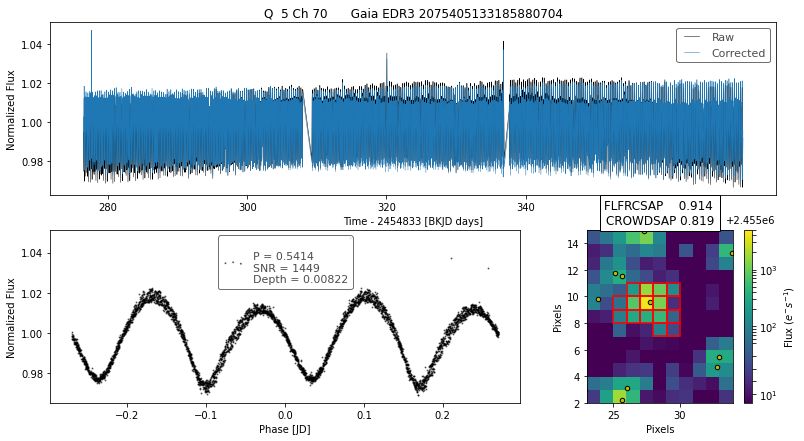

___________________________________________________
BLS_period          5.413673e-01
BLS_period_SNR      5.899860e+01
BLS_duration        4.500000e-01
BLS_depth           2.305653e-03
BLS_transit_time    2.455277e+06
channel             7.000000e+01
quarter             5.000000e+00
ra                  2.983023e+02
dec                 4.179642e+01
Name: Gaia EDR3 2075405133185894656, dtype: float64


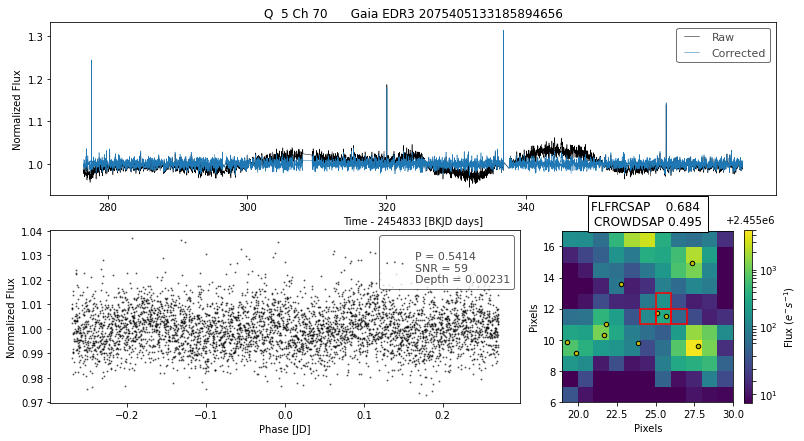

___________________________________________________
BLS_period          6.306833e-01
BLS_period_SNR      3.332612e+02
BLS_duration        4.500000e-01
BLS_depth           7.275385e-04
BLS_transit_time    2.455277e+06
channel             7.000000e+01
quarter             5.000000e+00
ra                  2.983188e+02
dec                 4.179312e+01
Name: Gaia EDR3 2075406541944219520, dtype: float64


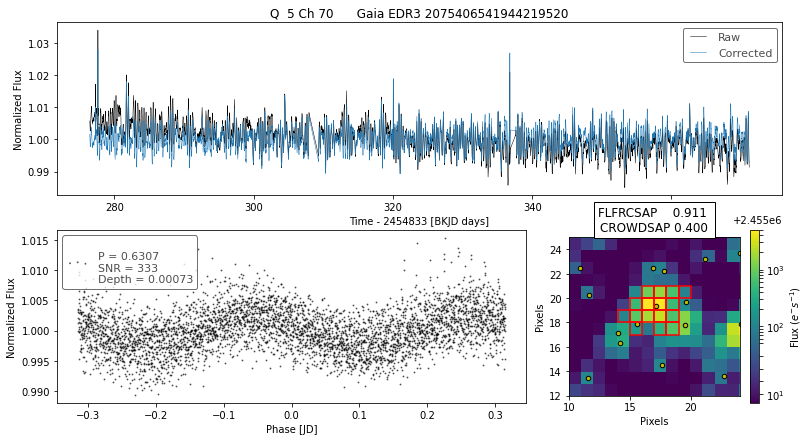

___________________________________________________
BLS_period          7.078671e-01
BLS_period_SNR      6.727262e+01
BLS_duration        1.500000e-01
BLS_depth           9.672388e-04
BLS_transit_time    2.455277e+06
channel             7.100000e+01
quarter             5.000000e+00
ra                  2.990061e+02
dec                 4.078565e+01
Name: Gaia EDR3 2073608428123884416, dtype: float64


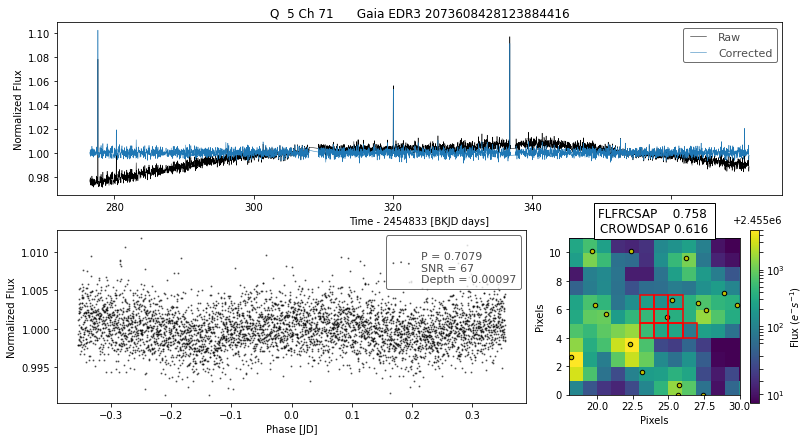

___________________________________________________
BLS_period          2.006032e+00
BLS_period_SNR      4.022445e+02
BLS_duration        9.900000e-02
BLS_depth           1.983958e-03
BLS_transit_time    2.455278e+06
channel             7.100000e+01
quarter             5.000000e+00
ra                  2.990175e+02
dec                 4.078657e+01
Name: Gaia EDR3 2073608462478158848, dtype: float64


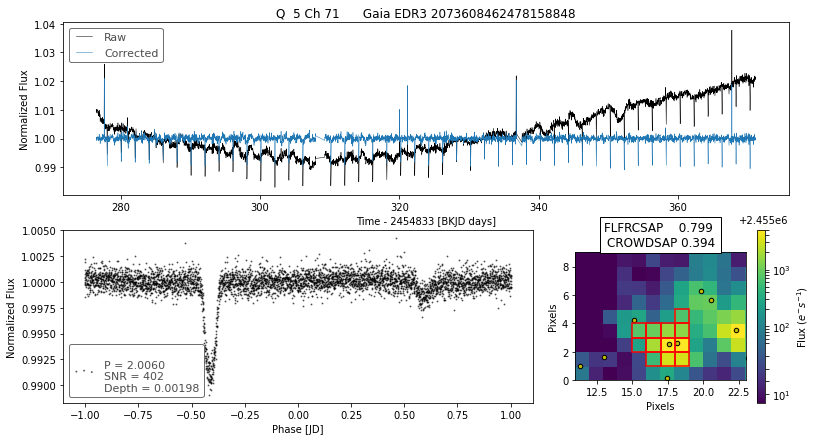

___________________________________________________
BLS_period          2.006032e+00
BLS_period_SNR      4.211319e+02
BLS_duration        9.900000e-02
BLS_depth           2.050735e-03
BLS_transit_time    2.455278e+06
channel             7.100000e+01
quarter             5.000000e+00
ra                  2.990168e+02
dec                 4.078636e+01
Name: Gaia EDR3 2073608462483635968, dtype: float64


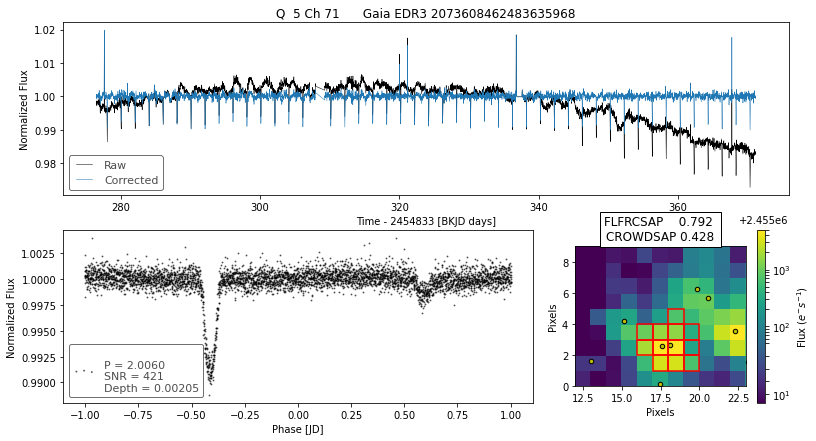

___________________________________________________
BLS_period          7.078671e-01
BLS_period_SNR      7.109393e+01
BLS_duration        1.260000e-01
BLS_depth           5.629940e-04
BLS_transit_time    2.455277e+06
channel             7.200000e+01
quarter             5.000000e+00
ra                  2.976515e+02
dec                 4.023780e+01
Name: Gaia EDR3 2073682438989499392, dtype: float64


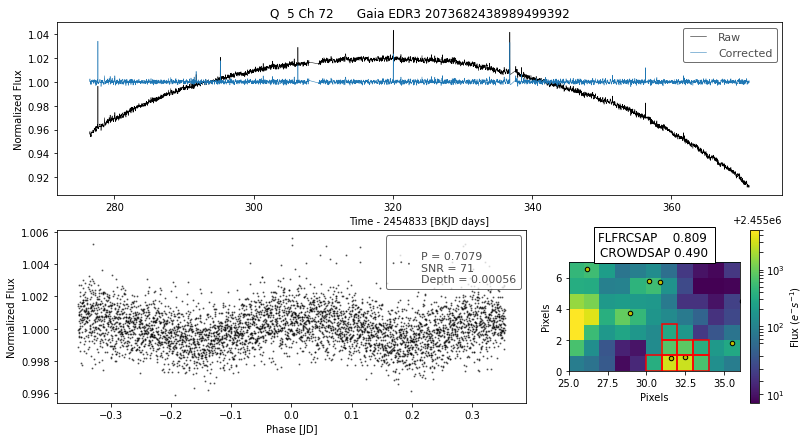

___________________________________________________
BLS_period          7.078671e-01
BLS_period_SNR      5.366811e+01
BLS_duration        1.260000e-01
BLS_depth           4.261836e-04
BLS_transit_time    2.455277e+06
channel             7.200000e+01
quarter             5.000000e+00
ra                  2.976526e+02
dec                 4.023827e+01
Name: Gaia EDR3 2073682438989966592, dtype: float64


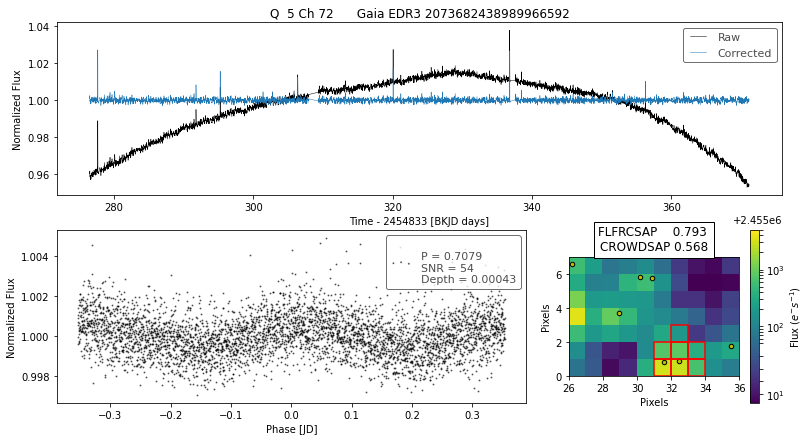

___________________________________________________
BLS_period          7.078671e-01
BLS_period_SNR      1.735353e+05
BLS_duration        4.500000e-01
BLS_depth           7.558699e-02
BLS_transit_time    2.455277e+06
channel             7.200000e+01
quarter             5.000000e+00
ra                  2.976401e+02
dec                 4.023606e+01
Name: Gaia EDR3 2073682645147919616, dtype: float64


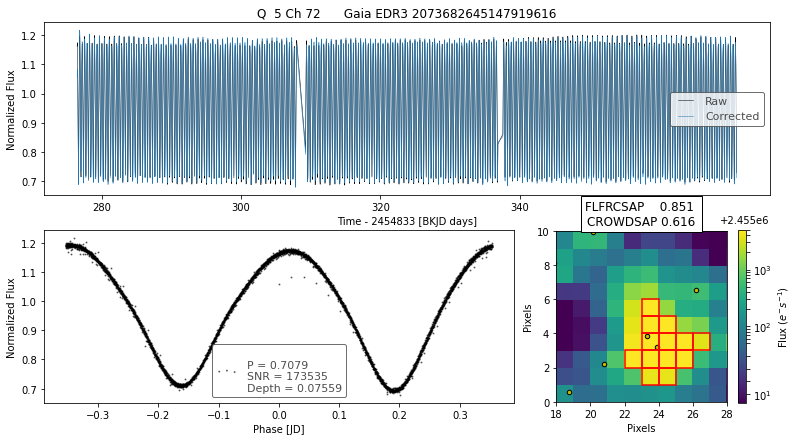

___________________________________________________
BLS_period          7.071779e-01
BLS_period_SNR      1.464159e+04
BLS_duration        1.500000e-01
BLS_depth           1.089877e-01
BLS_transit_time    2.455277e+06
channel             7.300000e+01
quarter             5.000000e+00
ra                  2.954191e+02
dec                 4.910628e+01
Name: Gaia EDR3 2134814804448660608, dtype: float64


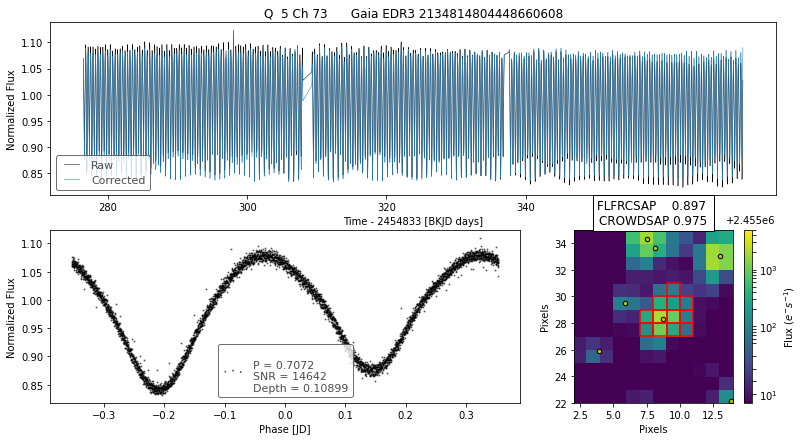

___________________________________________________
BLS_period          2.170456e+00
BLS_period_SNR      2.653747e+02
BLS_duration        1.260000e-01
BLS_depth           1.089285e-02
BLS_transit_time    2.455277e+06
channel             7.700000e+01
quarter             5.000000e+00
ra                  2.974162e+02
dec                 4.662285e+01
Name: Gaia EDR3 2080297753770786944, dtype: float64


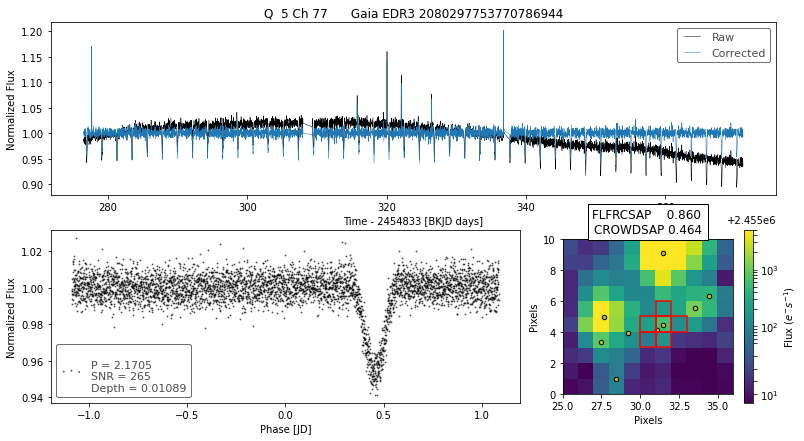

___________________________________________________
BLS_period          8.278529e-01
BLS_period_SNR      1.825632e+03
BLS_duration        5.100000e-02
BLS_depth           4.862135e-02
BLS_transit_time    2.455277e+06
channel             7.700000e+01
quarter             5.000000e+00
ra                  2.974162e+02
dec                 4.662538e+01
Name: Gaia EDR3 2080297753770788864, dtype: float64


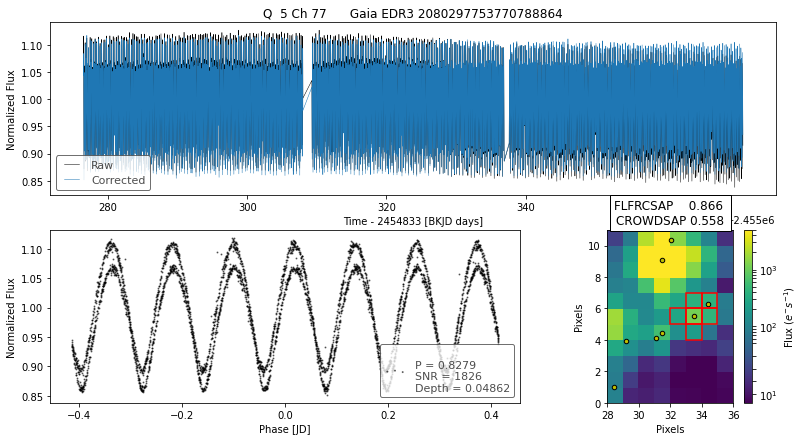

___________________________________________________
BLS_period          6.359473e+00
BLS_period_SNR      2.395301e+02
BLS_duration        3.990000e-01
BLS_depth           1.276964e-02
BLS_transit_time    2.455277e+06
channel             7.800000e+01
quarter             5.000000e+00
ra                  2.965900e+02
dec                 4.764813e+01
Name: Gaia EDR3 2086592354758573568, dtype: float64


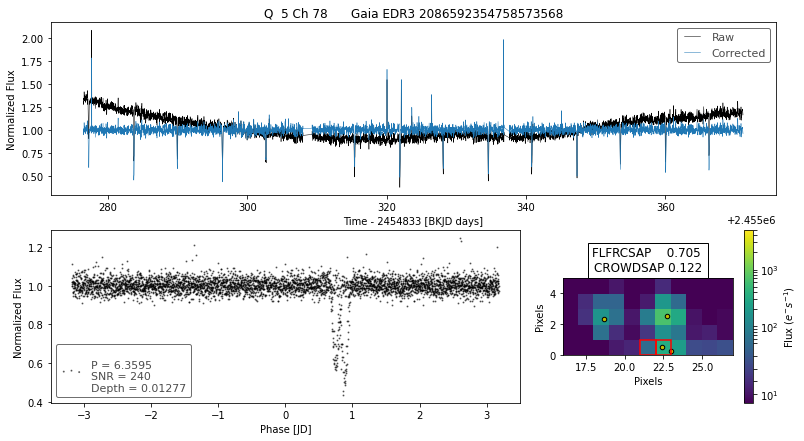

___________________________________________________
BLS_period          2.632309e+00
BLS_period_SNR      2.526145e+03
BLS_duration        1.740000e-01
BLS_depth           1.815515e-01
BLS_transit_time    2.455277e+06
channel             7.900000e+01
quarter             5.000000e+00
ra                  2.980446e+02
dec                 4.818158e+01
Name: Gaia EDR3 2086516449796423936, dtype: float64


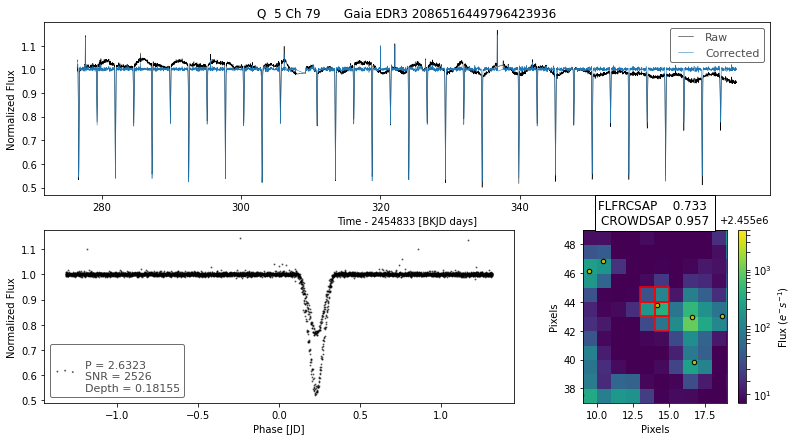

___________________________________________________
BLS_period          2.632309e+00
BLS_period_SNR      5.217249e+01
BLS_duration        1.260000e-01
BLS_depth           1.917452e-03
BLS_transit_time    2.455277e+06
channel             7.900000e+01
quarter             5.000000e+00
ra                  2.980477e+02
dec                 4.817962e+01
Name: Gaia EDR3 2086516454099067776, dtype: float64


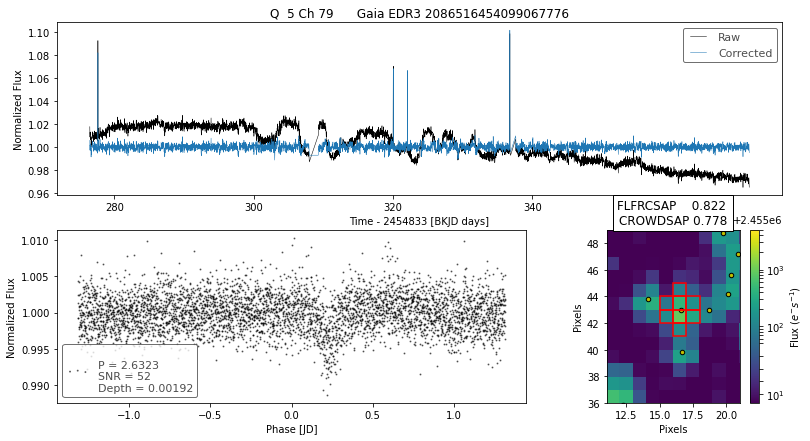

___________________________________________________
BLS_period          6.285003e-01
BLS_period_SNR      8.482353e+01
BLS_duration        5.100000e-02
BLS_depth           1.849365e-02
BLS_transit_time    2.455277e+06
channel             8.100000e+01
quarter             5.000000e+00
ra                  2.993351e+02
dec                 4.407973e+01
Name: Gaia EDR3 2079019292324040704, dtype: float64


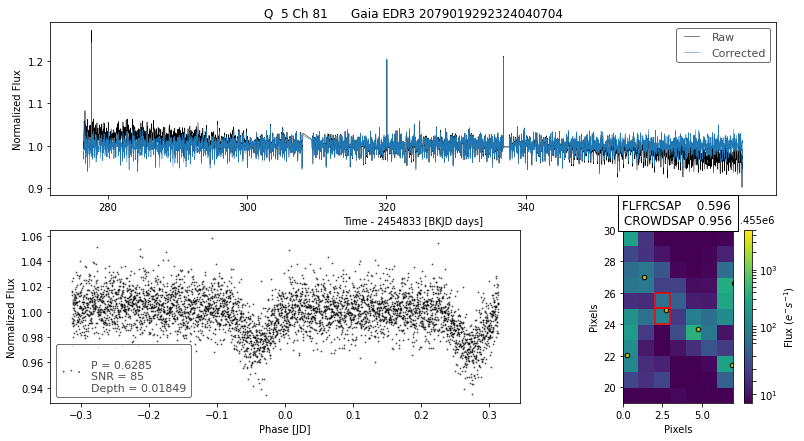

___________________________________________________
BLS_period          1.123651e+01
BLS_period_SNR      8.419599e+01
BLS_duration        9.900000e-02
BLS_depth           1.319522e-02
BLS_transit_time    2.455279e+06
channel             8.200000e+01
quarter             5.000000e+00
ra                  2.985338e+02
dec                 4.514959e+01
Name: Gaia EDR3 2079399006085883008, dtype: float64


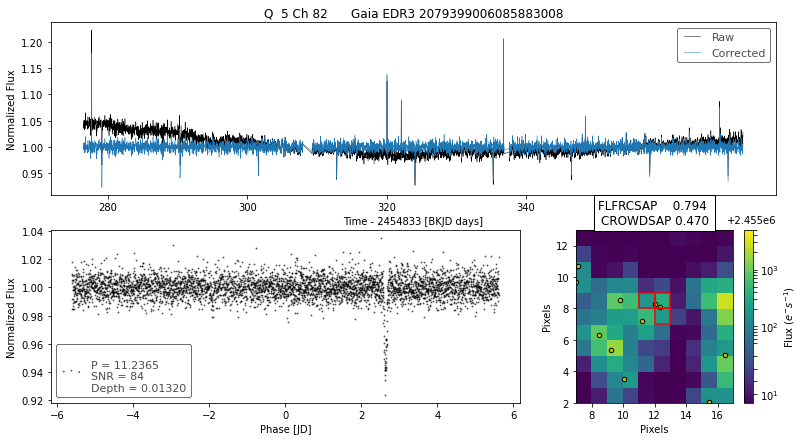

___________________________________________________
BLS_period          7.019059e-01
BLS_period_SNR      2.011499e+02
BLS_duration        5.100000e-02
BLS_depth           2.486457e-02
BLS_transit_time    2.455277e+06
channel             8.400000e+01
quarter             5.000000e+00
ra                  3.007063e+02
dec                 4.458818e+01
Name: Gaia EDR3 2082091568328182528, dtype: float64


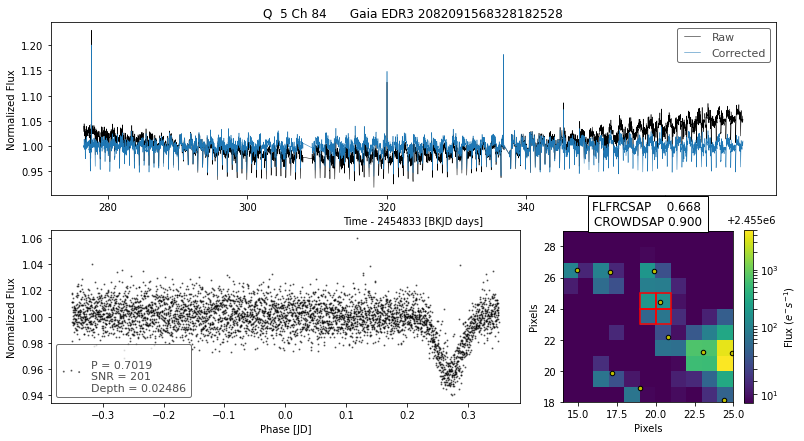

___________________________________________________
BLS_period          9.696313e-01
BLS_period_SNR      1.492639e+02
BLS_duration        9.900000e-02
BLS_depth           9.448619e-02
BLS_transit_time    2.455373e+06
channel             4.000000e+00
quarter             6.000000e+00
ra                  2.912734e+02
dec                 3.738868e+01
Name: Gaia EDR3 2052524429346526464, dtype: float64


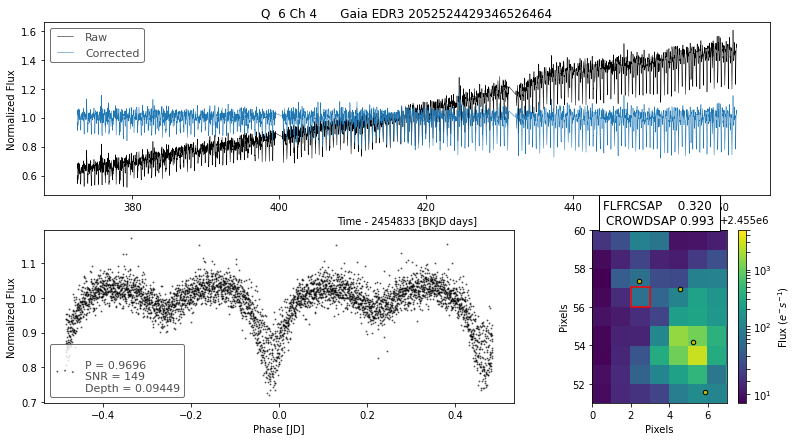

___________________________________________________
BLS_period          3.554231e+00
BLS_period_SNR      4.145323e+02
BLS_duration        2.010000e-01
BLS_depth           2.813851e-02
BLS_transit_time    2.455376e+06
channel             9.000000e+00
quarter             6.000000e+00
ra                  2.968900e+02
dec                 4.122338e+01
Name: Gaia EDR3 2076836727387736576, dtype: float64


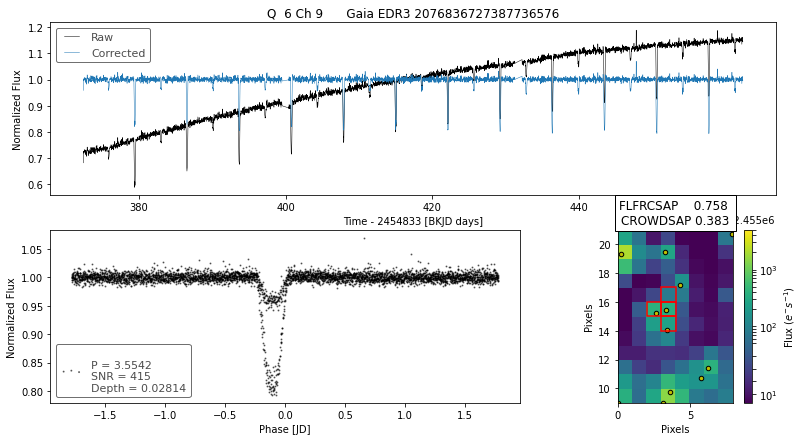

___________________________________________________
BLS_period          6.048002e-01
BLS_period_SNR      2.193665e+02
BLS_duration        3.990000e-01
BLS_depth           2.754031e-02
BLS_transit_time    2.455373e+06
channel             2.200000e+01
quarter             6.000000e+00
ra                  2.930244e+02
dec                 4.286320e+01
Name: Gaia EDR3 2077810555389602176, dtype: float64


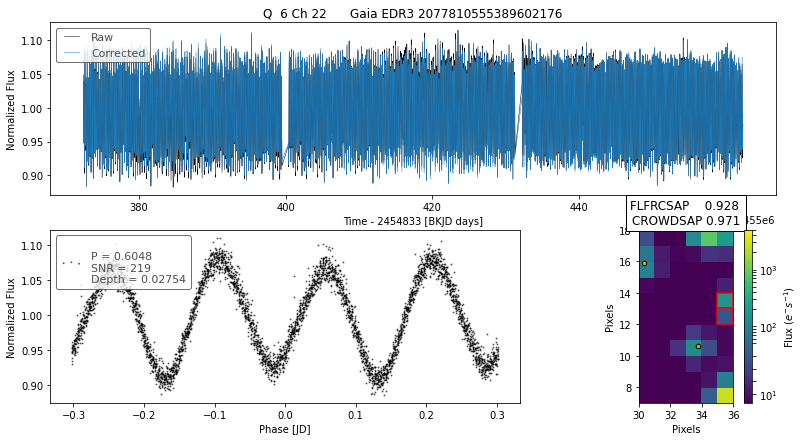

___________________________________________________
BLS_period          5.337516e-01
BLS_period_SNR      1.056243e+02
BLS_duration        4.500000e-01
BLS_depth           1.101425e-02
BLS_transit_time    2.455373e+06
channel             3.400000e+01
quarter             6.000000e+00
ra                  2.853720e+02
dec                 4.107108e+01
Name: Gaia EDR3 2103827298302304128, dtype: float64


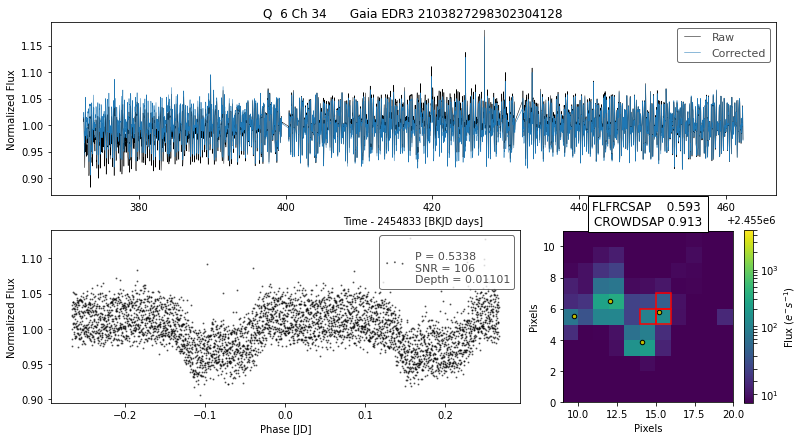

___________________________________________________
BLS_period          6.083461e-01
BLS_period_SNR      4.848470e+01
BLS_duration        4.500000e-01
BLS_depth           2.112517e-04
BLS_transit_time    2.455373e+06
channel             4.300000e+01
quarter             6.000000e+00
ra                  2.904550e+02
dec                 4.368058e+01
Name: Gaia EDR3 2126083788772171648, dtype: float64


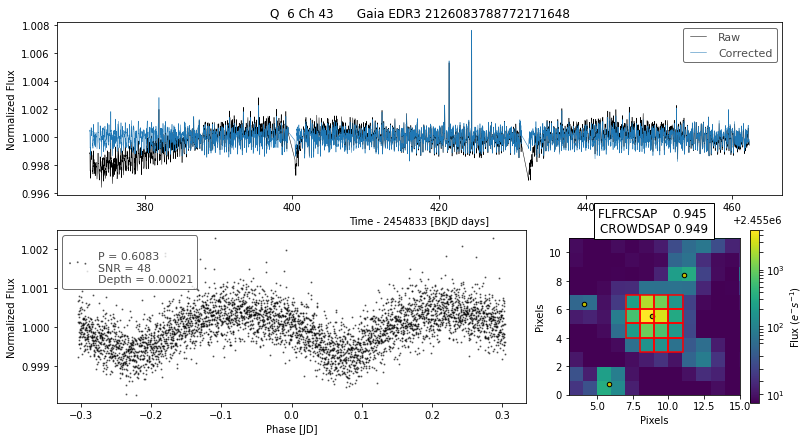

___________________________________________________
BLS_period          6.013664e-01
BLS_period_SNR      1.893011e+02
BLS_duration        3.990000e-01
BLS_depth           2.233859e-02
BLS_transit_time    2.455373e+06
channel             4.300000e+01
quarter             6.000000e+00
ra                  2.904762e+02
dec                 4.371659e+01
Name: Gaia EDR3 2126085369316699648, dtype: float64


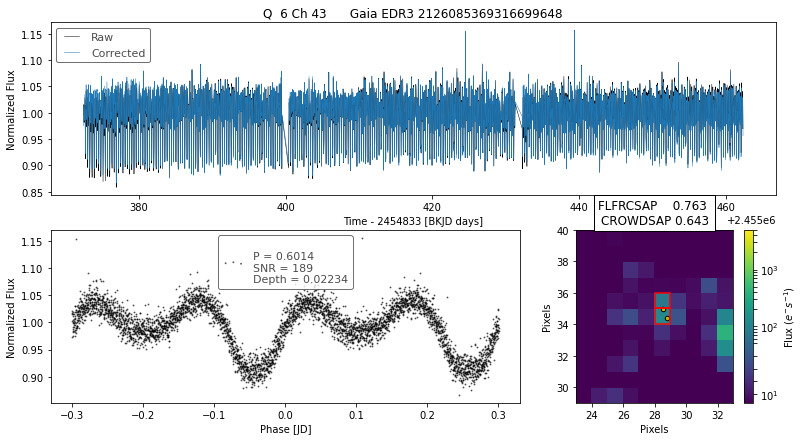

___________________________________________________
BLS_period          8.419738e-01
BLS_period_SNR      7.620877e+02
BLS_duration        5.100000e-02
BLS_depth           3.655029e-02
BLS_transit_time    2.455373e+06
channel             4.300000e+01
quarter             6.000000e+00
ra                  2.904955e+02
dec                 4.371834e+01
Name: Gaia EDR3 2126085369320144640, dtype: float64


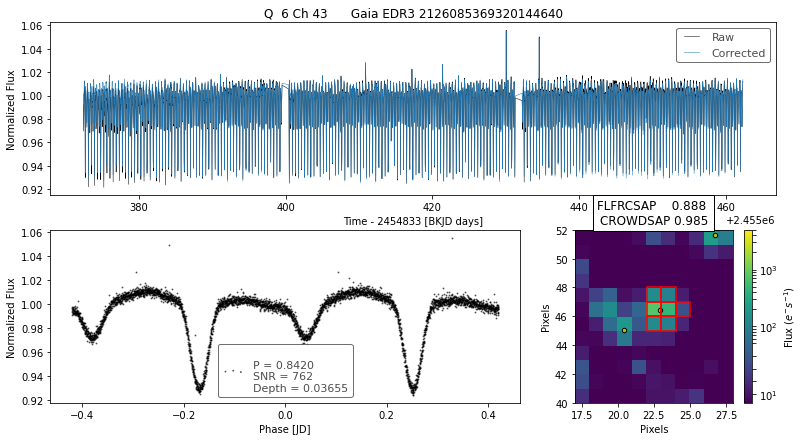

___________________________________________________
BLS_period          6.083461e-01
BLS_period_SNR      1.044619e+05
BLS_duration        4.500000e-01
BLS_depth           1.631234e-01
BLS_transit_time    2.455373e+06
channel             4.400000e+01
quarter             6.000000e+00
ra                  2.895226e+02
dec                 4.468755e+01
Name: Gaia EDR3 2126955323535081728, dtype: float64


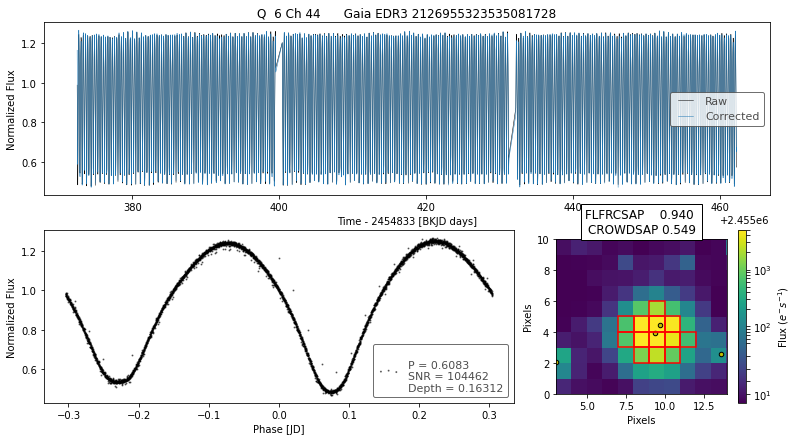

___________________________________________________
BLS_period          6.019360e-01
BLS_period_SNR      1.932575e+02
BLS_duration        3.990000e-01
BLS_depth           1.934922e-02
BLS_transit_time    2.455373e+06
channel             4.500000e+01
quarter             6.000000e+00
ra                  2.938288e+02
dec                 4.520800e+01
Name: Gaia EDR3 2127956149696086272, dtype: float64


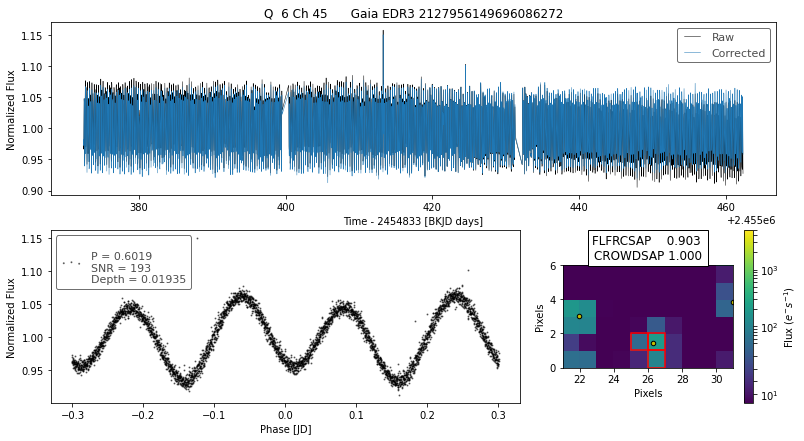

___________________________________________________
BLS_period          7.078671e-01
BLS_period_SNR      1.098843e+03
BLS_duration        1.260000e-01
BLS_depth           5.968305e-02
BLS_transit_time    2.455464e+06
channel             1.600000e+01
quarter             7.000000e+00
ra                  2.976434e+02
dec                 4.023257e+01
Name: Gaia EDR3 2073682640842559360, dtype: float64


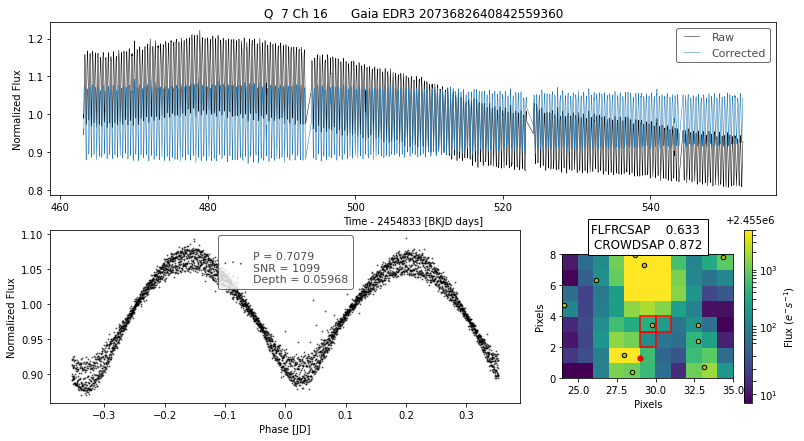

___________________________________________________
BLS_period          6.378039e-01
BLS_period_SNR      1.289253e+03
BLS_duration        5.100000e-02
BLS_depth           3.218246e-01
BLS_transit_time    2.455464e+06
channel             1.700000e+01
quarter             7.000000e+00
ra                  2.959162e+02
dec                 4.274174e+01
Name: Gaia EDR3 2077245814431169792, dtype: float64


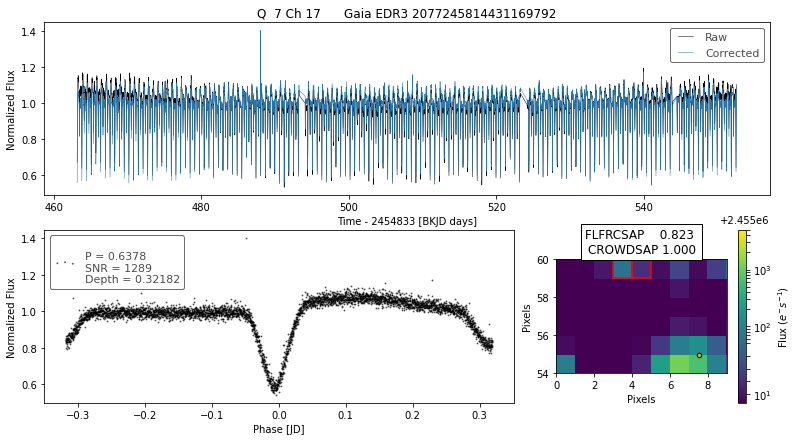

___________________________________________________
BLS_period          5.235289e-01
BLS_period_SNR      1.513347e+03
BLS_duration        4.500000e-01
BLS_depth           6.528912e-02
BLS_transit_time    2.455463e+06
channel             3.300000e+01
quarter             7.000000e+00
ra                  2.937044e+02
dec                 3.976863e+01
Name: Gaia EDR3 2052499488484831616, dtype: float64


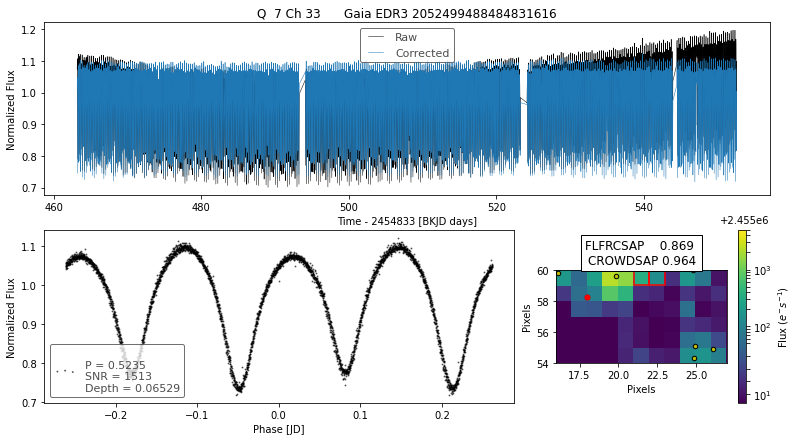

___________________________________________________
BLS_period          5.259660e-01
BLS_period_SNR      3.043368e+02
BLS_duration        4.500000e-01
BLS_depth           6.108658e-02
BLS_transit_time    2.455569e+06
channel             6.000000e+01
quarter             8.000000e+00
ra                  2.971904e+02
dec                 4.325260e+01
Name: Gaia EDR3 2078734140854317440, dtype: float64


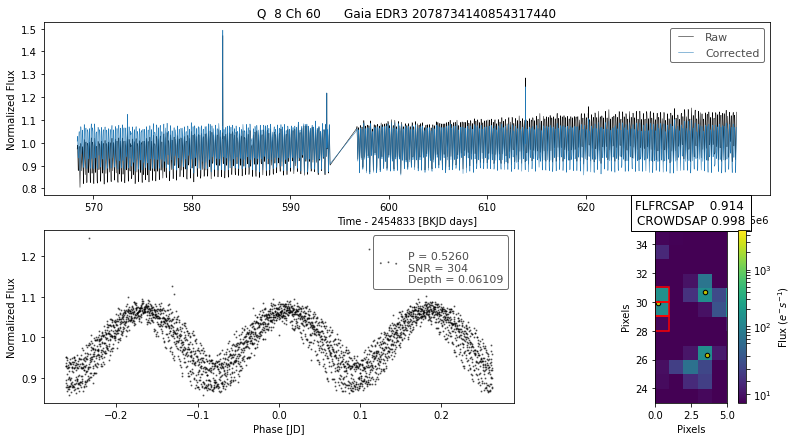

___________________________________________________


In [514]:
plot_highlights(ebs_cand, aperture="7")

In [471]:
clcs, metrics = give_me_lc(ebs_cand, aperture="7", plot=False)

Gaia EDR3 2104814389164263168
Complete =  0.6128
Contamin =  0.8732
Neigbors =  12.39526947830405


/Users/jorgemarpa/.pyenv/versions/adap/lib/python3.8/site-packages/lightkurve/lightcurve.py:876: LightkurveWarning: `epoch_time` appears to be given in JD, however the light curve time uses BKJD (i.e. JD - 2454833).
  warnings.warn(


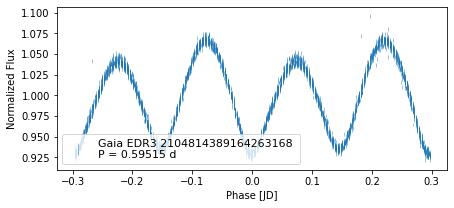

In [474]:
results = []

for i, (name, clc) in enumerate(clcs.items()):
    print(name)
    print("Complete = ", metrics[name][0])
    print("Contamin = ", metrics[name][1])
    print("Neigbors = ", mdist.arcsec[i], " arcsec")
    aux_p  = ebs_cand.loc[name, "BLS_period"]
    aux_t0 = ebs_cand.loc[name, "BLS_duration"]
    res, _ = do_periodogram(clc, pmin=aux_p * 0.9, pmax=aux_p * 1.1, 
                            ffrac=1000,
                            dur0=None, method="bls", plot=True)
    plt.show()

    results.append(res)
    break
    
results_df = pd.DataFrame(results)